In [1]:
#autoreload
%load_ext autoreload
%autoreload 2
import torch
import matplotlib.pyplot as plt
import numpy as np
import featureman.gen_data as man
import featureman.utils as utils
from sklearn.cluster import SpectralClustering
import pickle
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
sae_dict = torch.load("sae_model_small_batch_2025-08-07_00-27-27.pth", map_location=device)
sae = man.BatchedSAE_Updated(input_dim=512, n_models=5, width_ratio=4).to(device)
sae.load_state_dict(sae_dict)

model_dict = torch.load("modular_arithmetic_model.pth", map_location=device)
model = man.OneLayerTransformer(p=113, d_model=128, nheads=4).to(device)
model.load_state_dict(model_dict)

<All keys matched successfully>

In [3]:
torch.manual_seed(1337)
# generate combination of all inputs a and b range (113)
a_values = np.arange(113)
b_values = np.arange(113)
# generate inputs for the model
inputs = np.array([[a_i, 113, b_i, 114] for a_i in a_values for b_i in b_values])
inputs = torch.tensor(inputs).to(device)  # Add batch dimension

logits, activations = model(inputs, return_activations=True)
activation_final = activations[:, -1, :].detach()
batched_acts = activation_final.unsqueeze(0).repeat(5, 1, 1).to(device)

In [4]:
import pickle

decoder = sae.W_d[3].detach() #2048 x 512

_, _, feat_acts, _ = sae(batched_acts)
features = feat_acts[3].detach() # 12769 x 512

with open("sae_clusters_small_batch_15.pkl", "rb") as f:
    clusters = pickle.load(f)
    clusters = [c for c in clusters if len(c) > 1]  # Filter out clusters with only one element

clusters = sorted(clusters, key=lambda x: len(x), reverse=True)  # Sort by size


In [5]:
mod_additions = inputs[:, 0] + inputs[:, 2]
mod_additions = mod_additions % 113

In [6]:
mod_additions = mod_additions.cpu().numpy()

{0: [{'type': 'cos', 'frequency': 6, 'magnitude': 74309.68}, {'type': 'sin', 'frequency': 6, 'magnitude': 28010.193}, {'type': 'sin', 'frequency': 18, 'magnitude': 2173.0872}], 1: [{'type': 'cos', 'frequency': 44, 'magnitude': 44286.31}, {'type': 'sin', 'frequency': 44, 'magnitude': 30561.365}, {'type': 'cos', 'frequency': 6, 'magnitude': 1462.322}], 2: [{'type': 'cos', 'frequency': 54, 'magnitude': 43152.12}, {'type': 'sin', 'frequency': 54, 'magnitude': 11479.183}, {'type': 'sin', 'frequency': 6, 'magnitude': 1378.8523}], 3: [{'type': 'sin', 'frequency': 6, 'magnitude': 62672.27}, {'type': 'cos', 'frequency': 6, 'magnitude': 23687.092}, {'type': 'cos', 'frequency': 18, 'magnitude': 2227.5225}], 4: [{'type': 'sin', 'frequency': 44, 'magnitude': 37936.05}, {'type': 'cos', 'frequency': 44, 'magnitude': 26014.566}, {'type': 'cos', 'frequency': 19, 'magnitude': 2145.023}], 5: [{'type': 'sin', 'frequency': 54, 'magnitude': 36741.305}, {'type': 'cos', 'frequency': 54, 'magnitude': 9244.924}

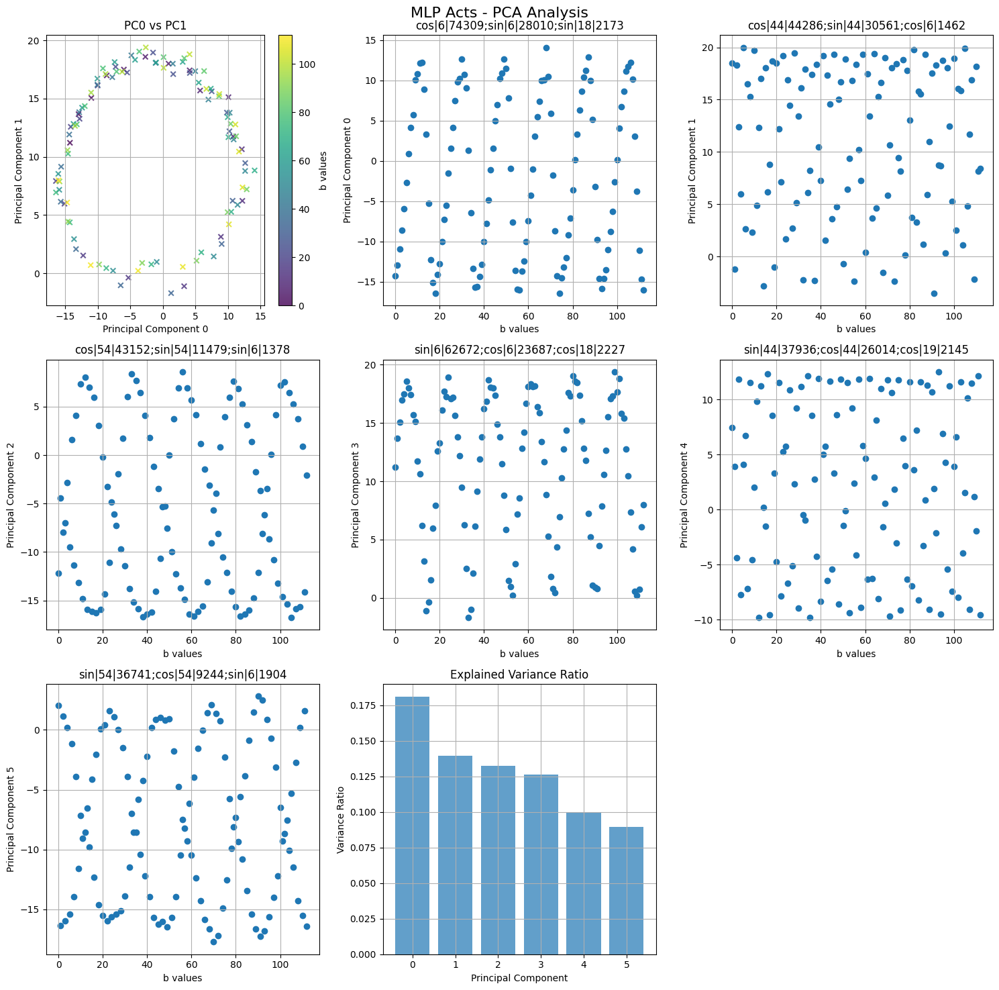

(12769, 6)


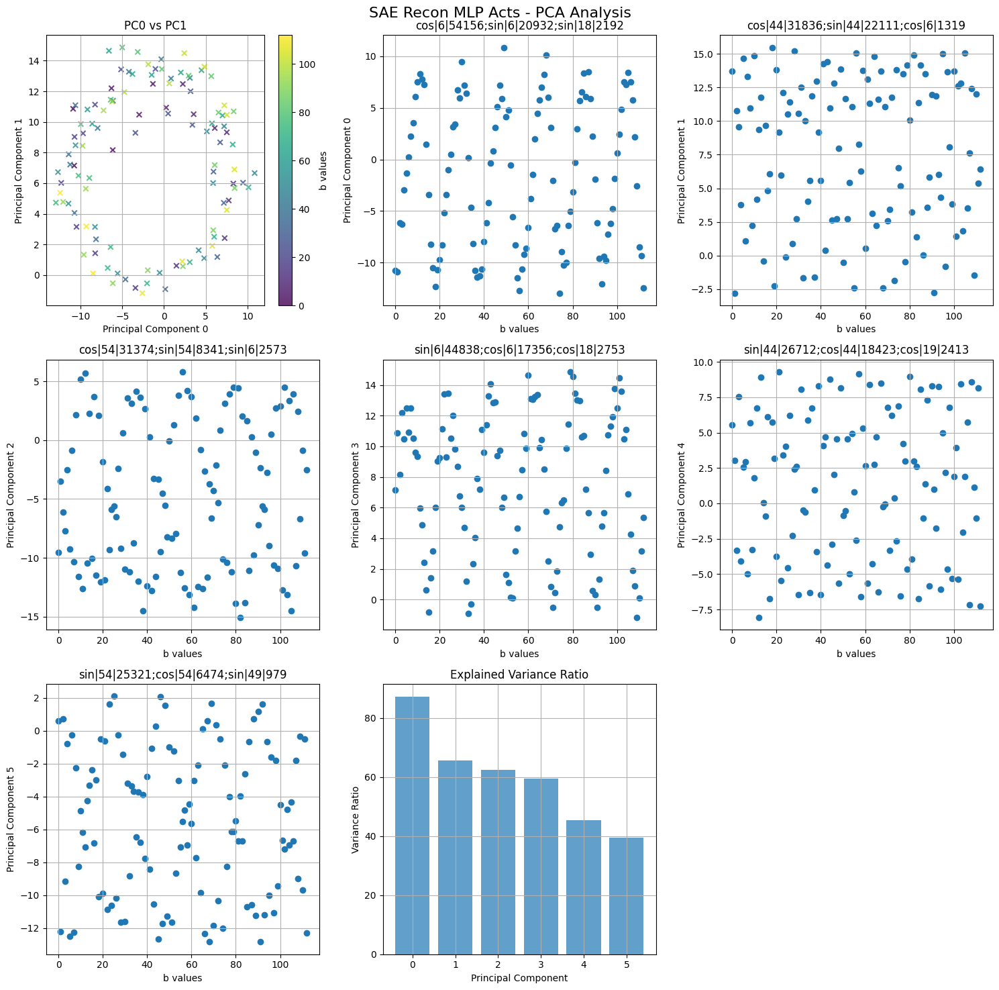

(12769, 6)


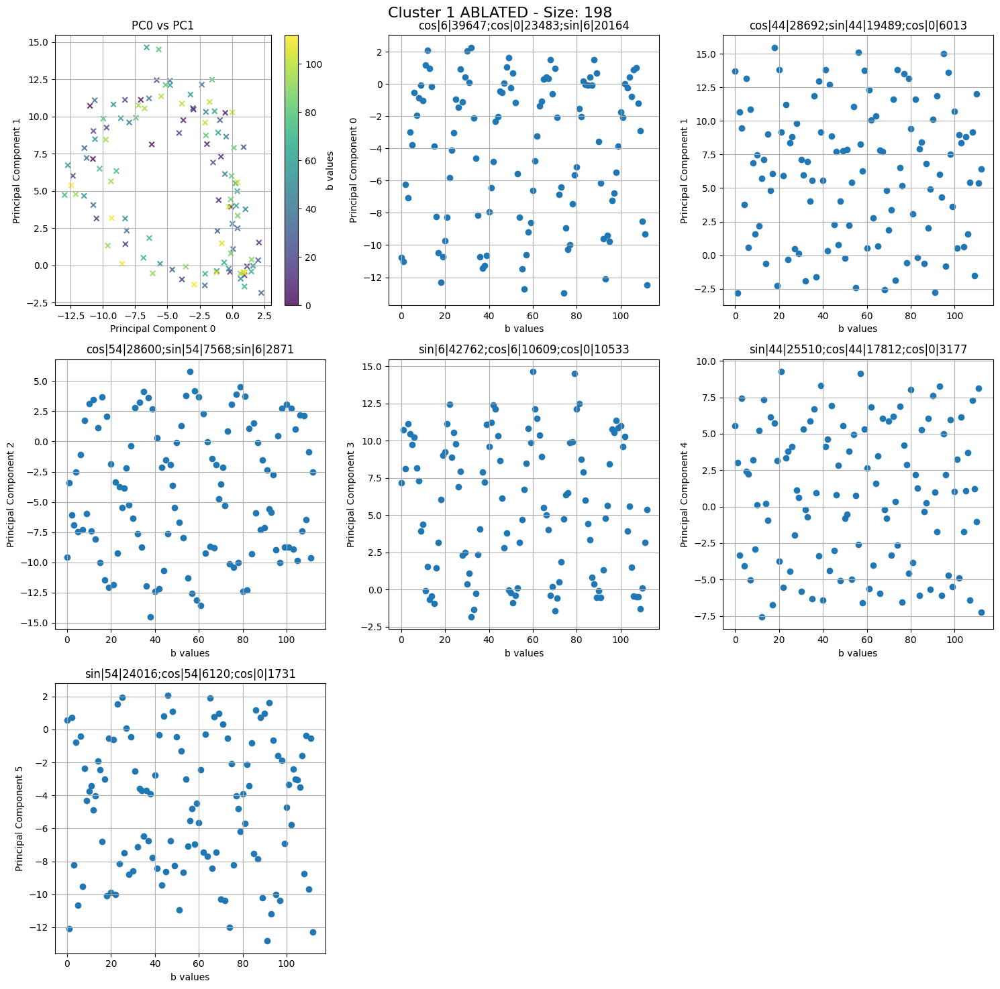

(12769, 6)


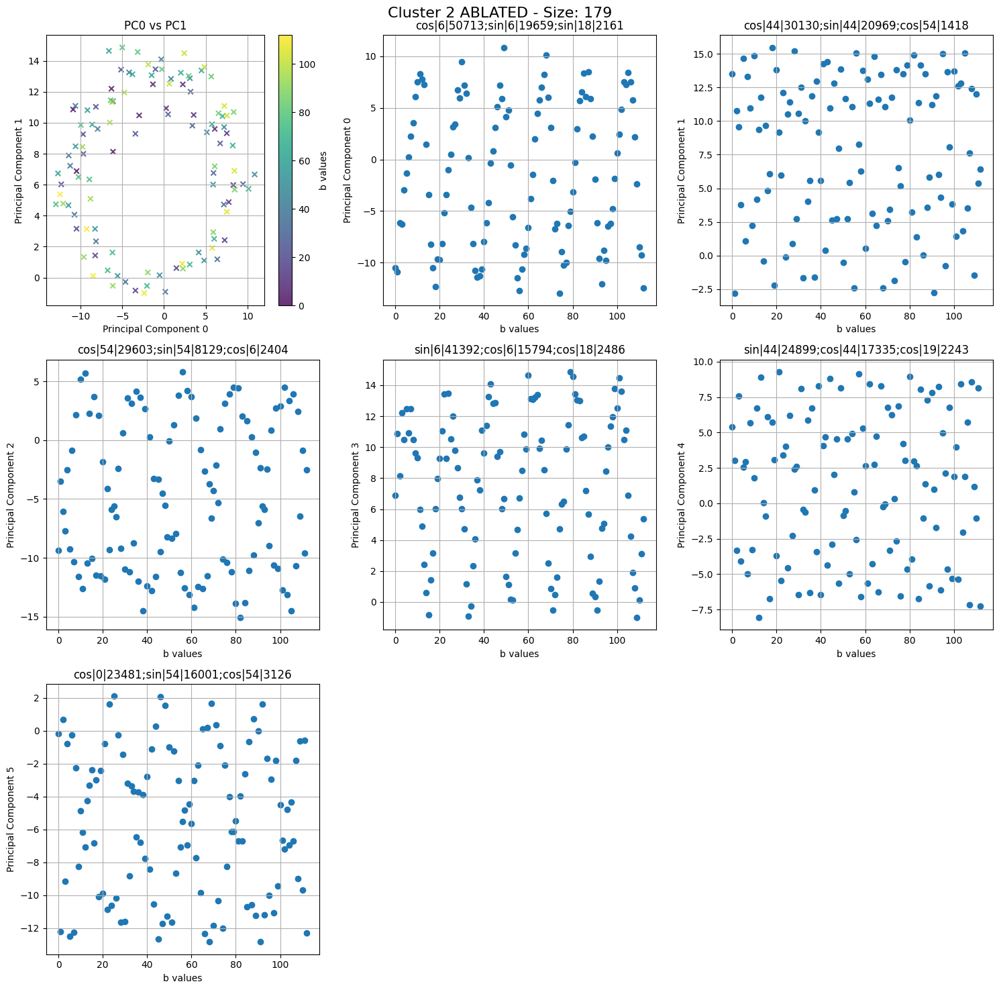

(12769, 6)


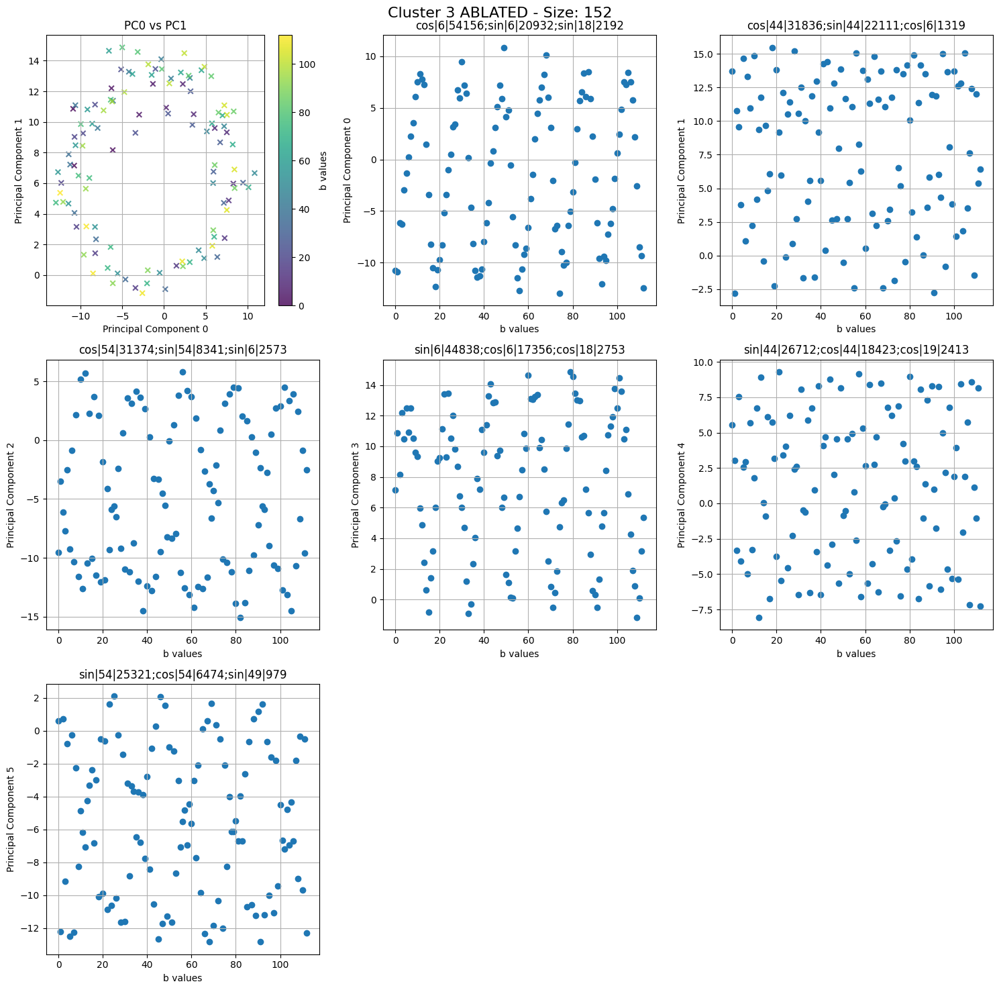

(12769, 6)


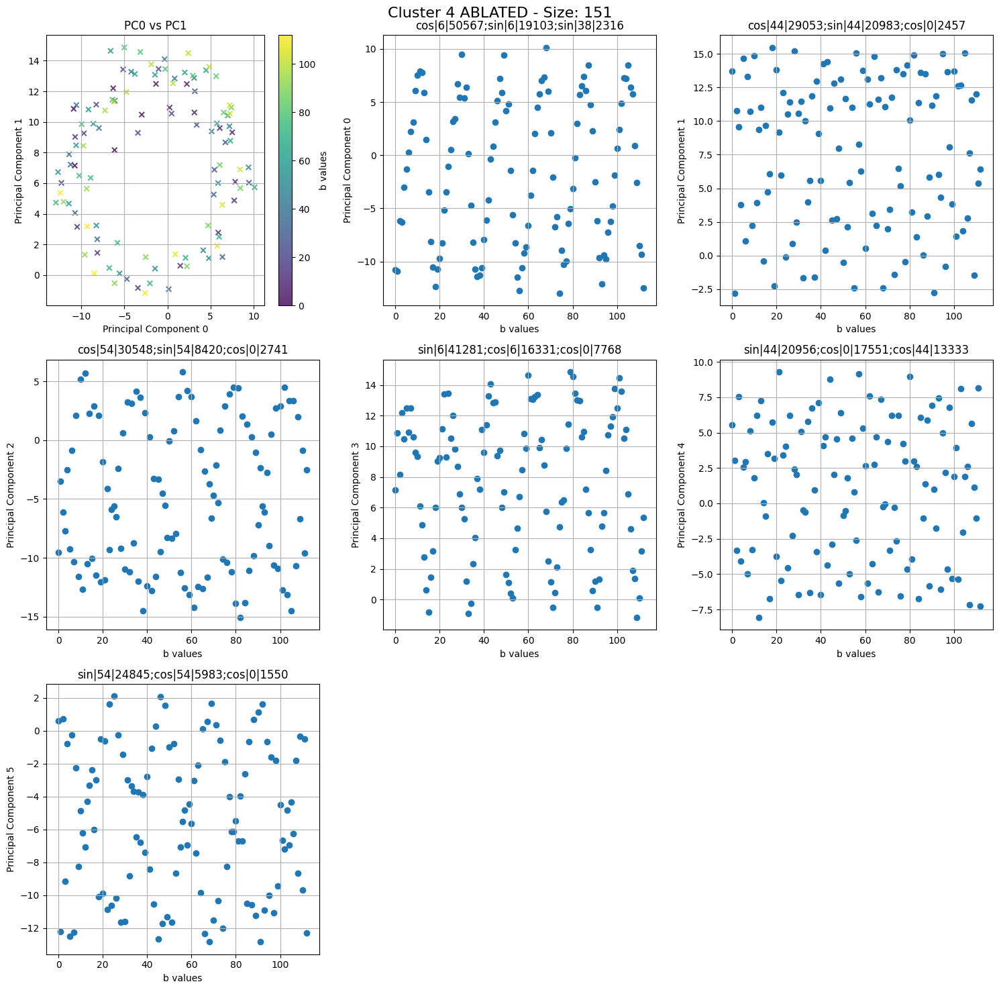

(12769, 6)


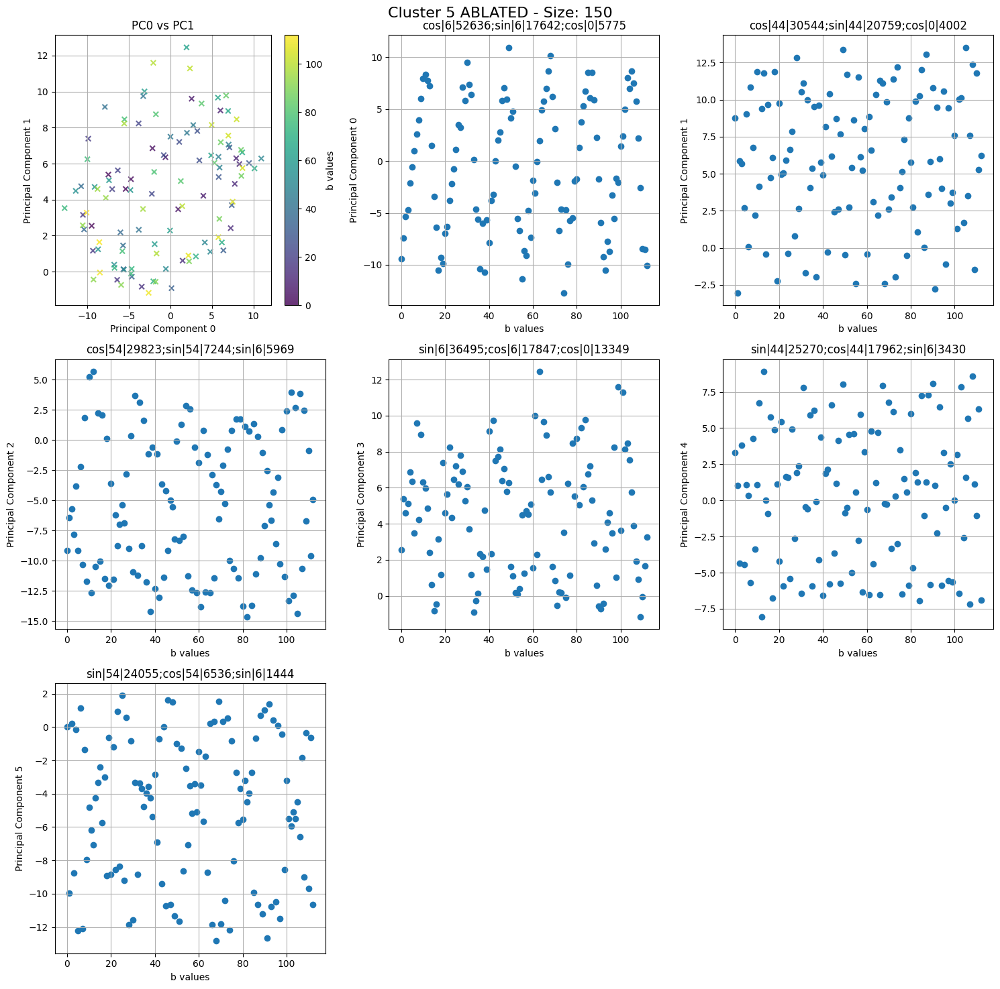

(12769, 6)


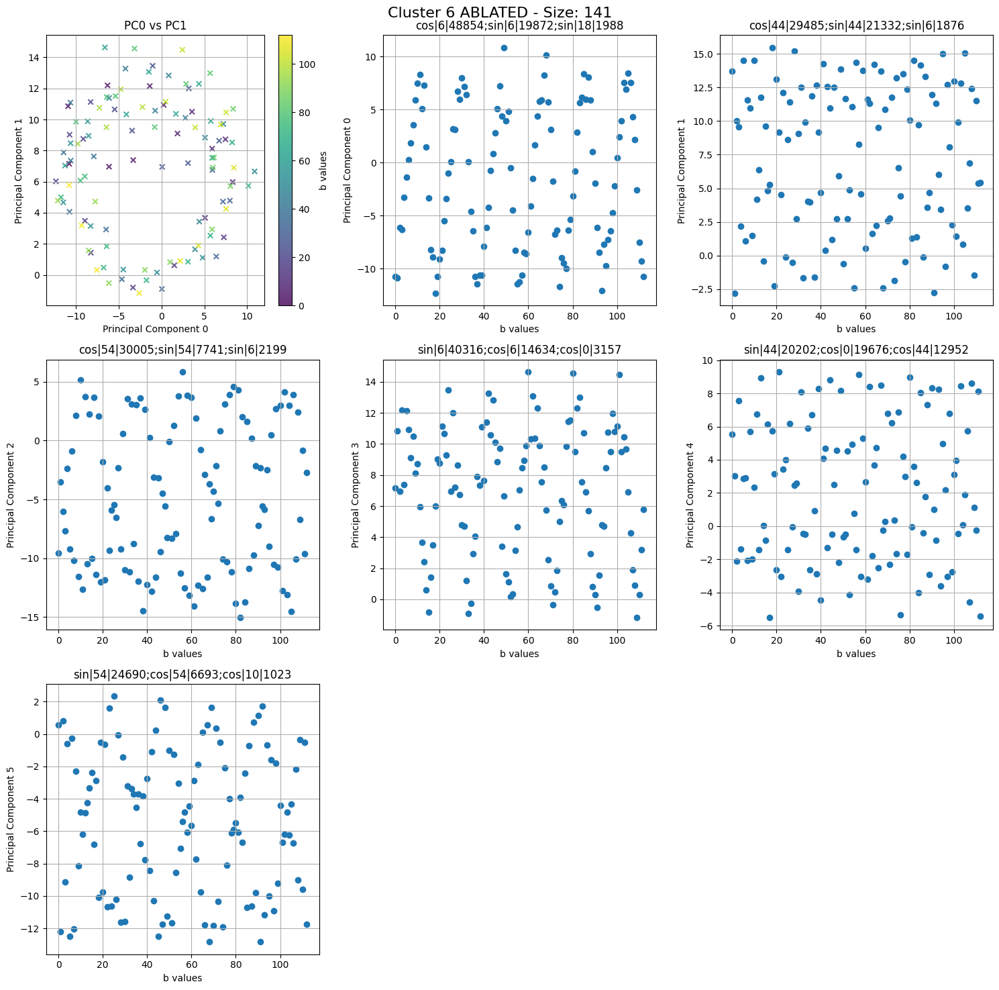

(12769, 6)


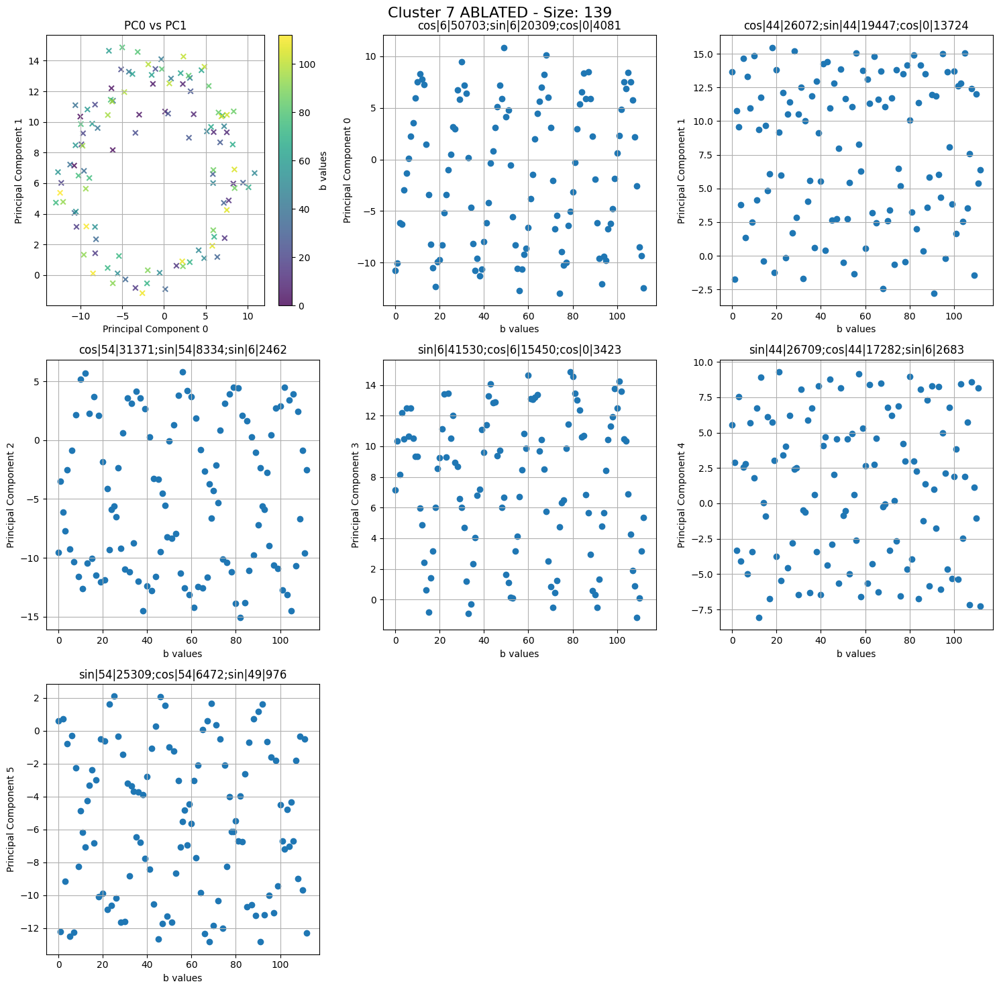

(12769, 6)


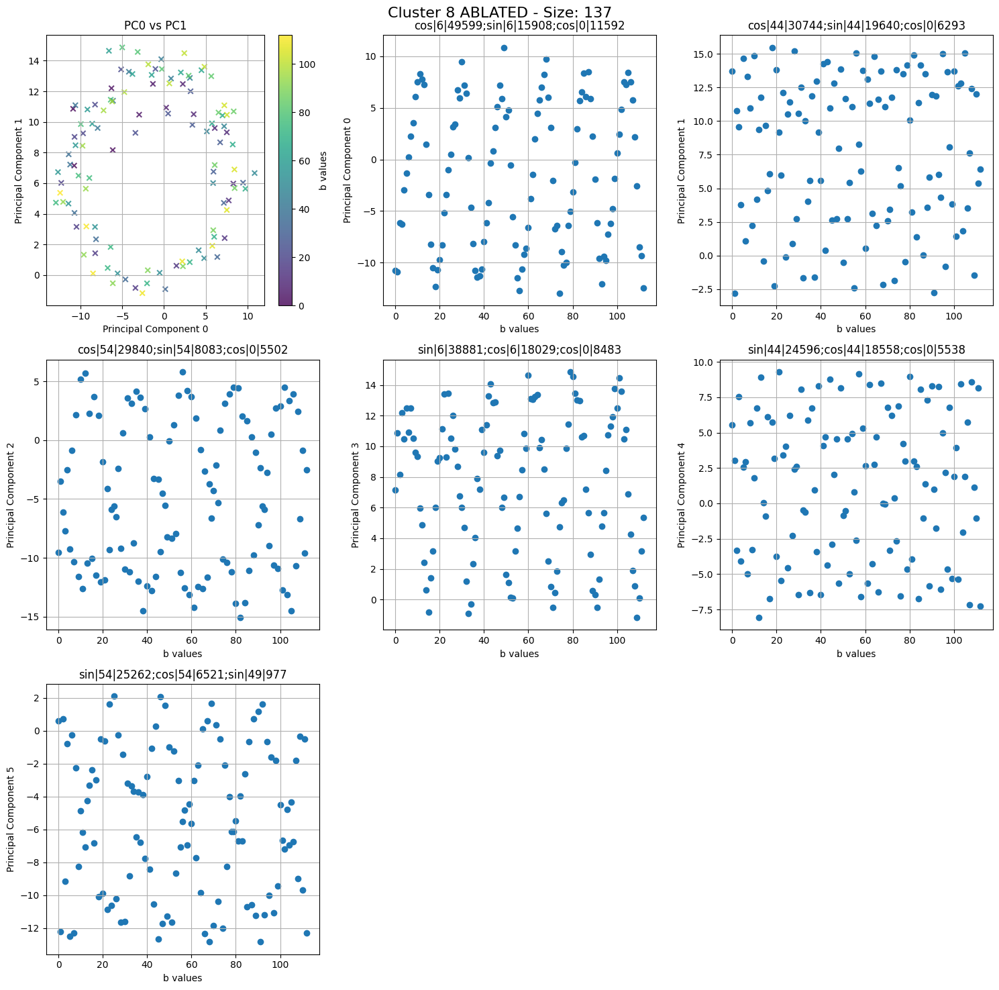

(12769, 6)


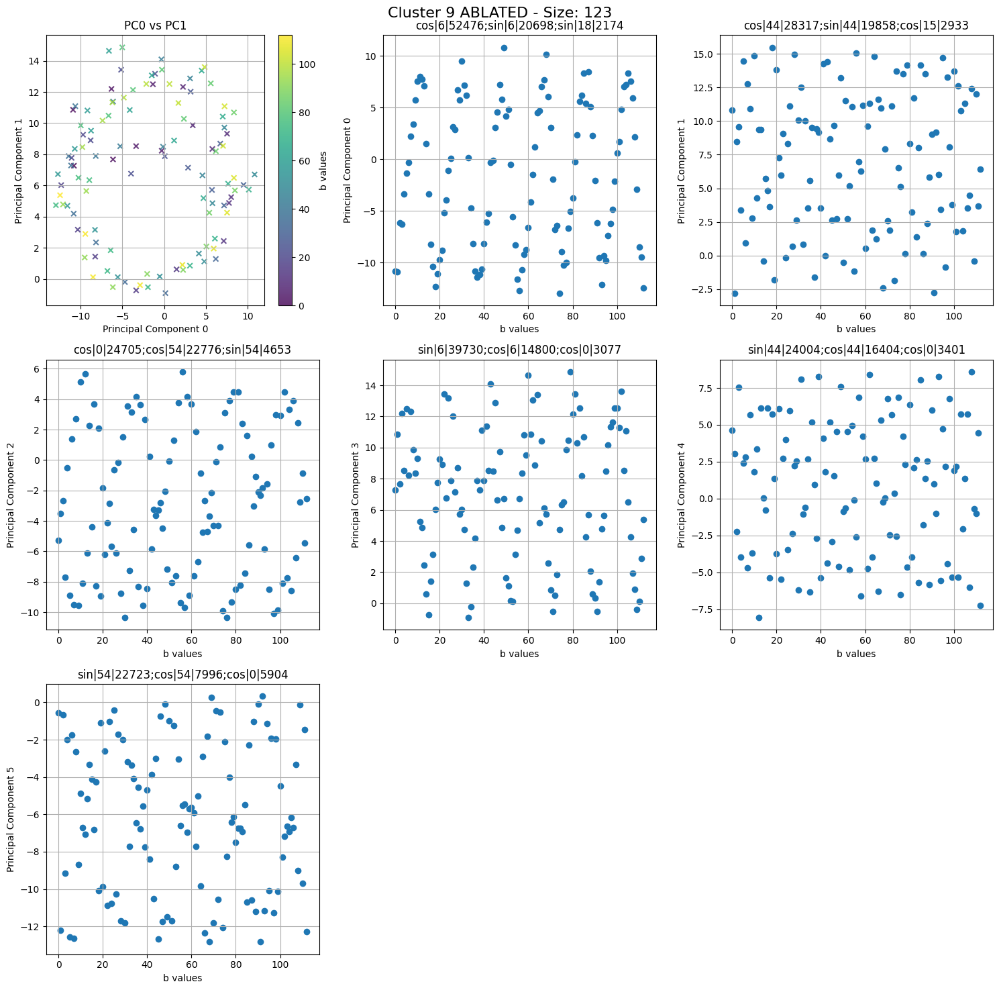

(12769, 6)


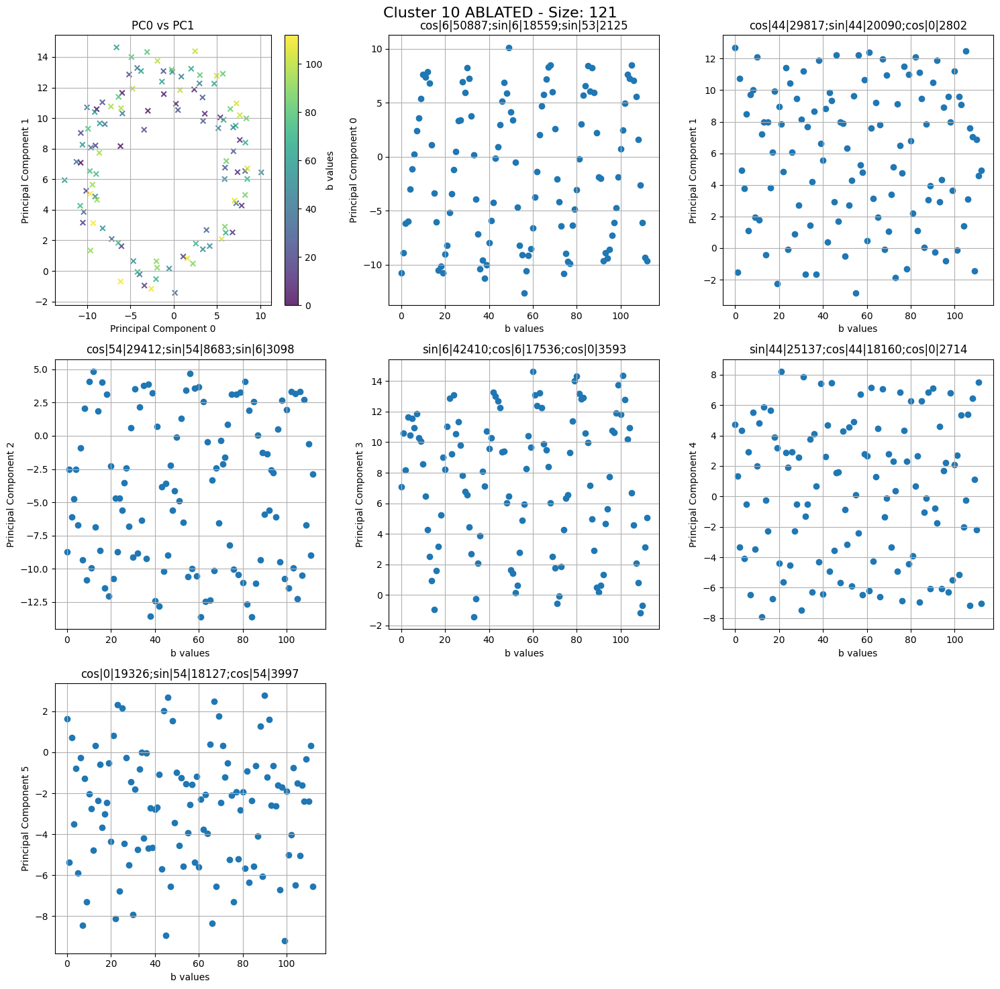

(12769, 6)


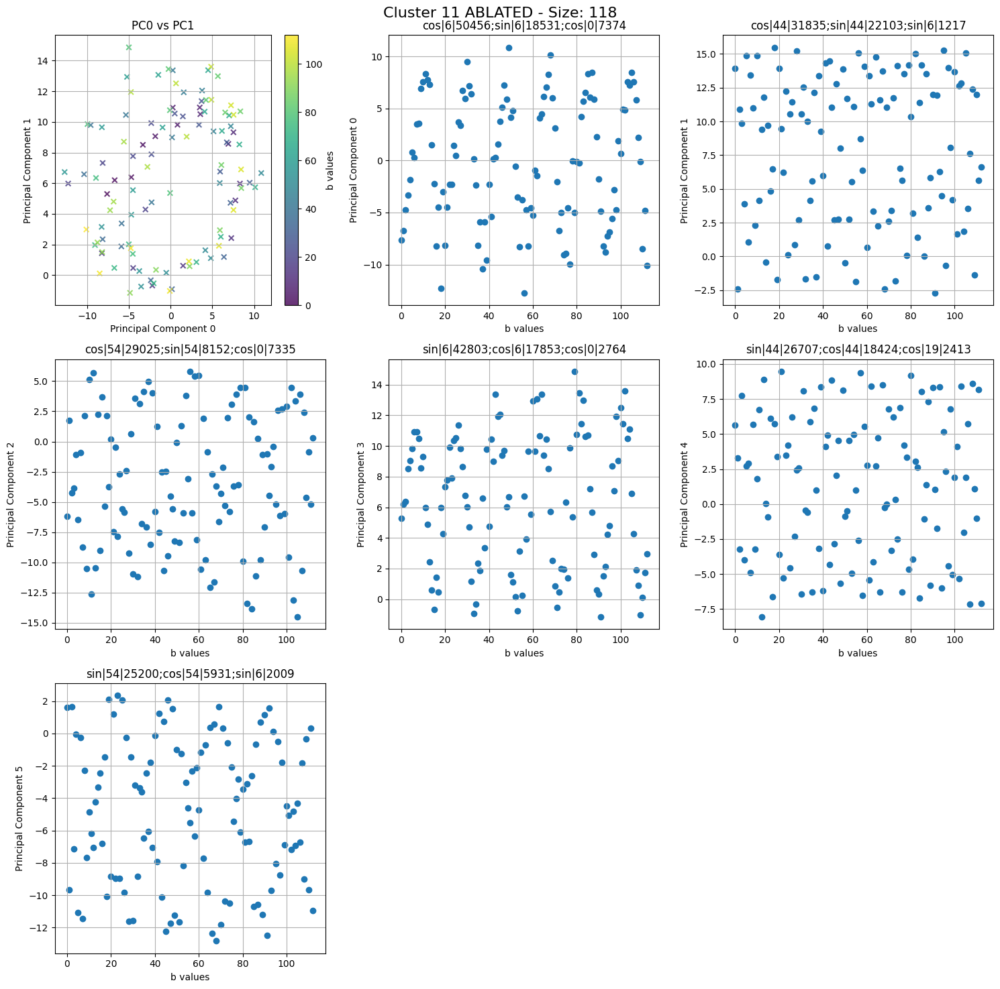

(12769, 6)


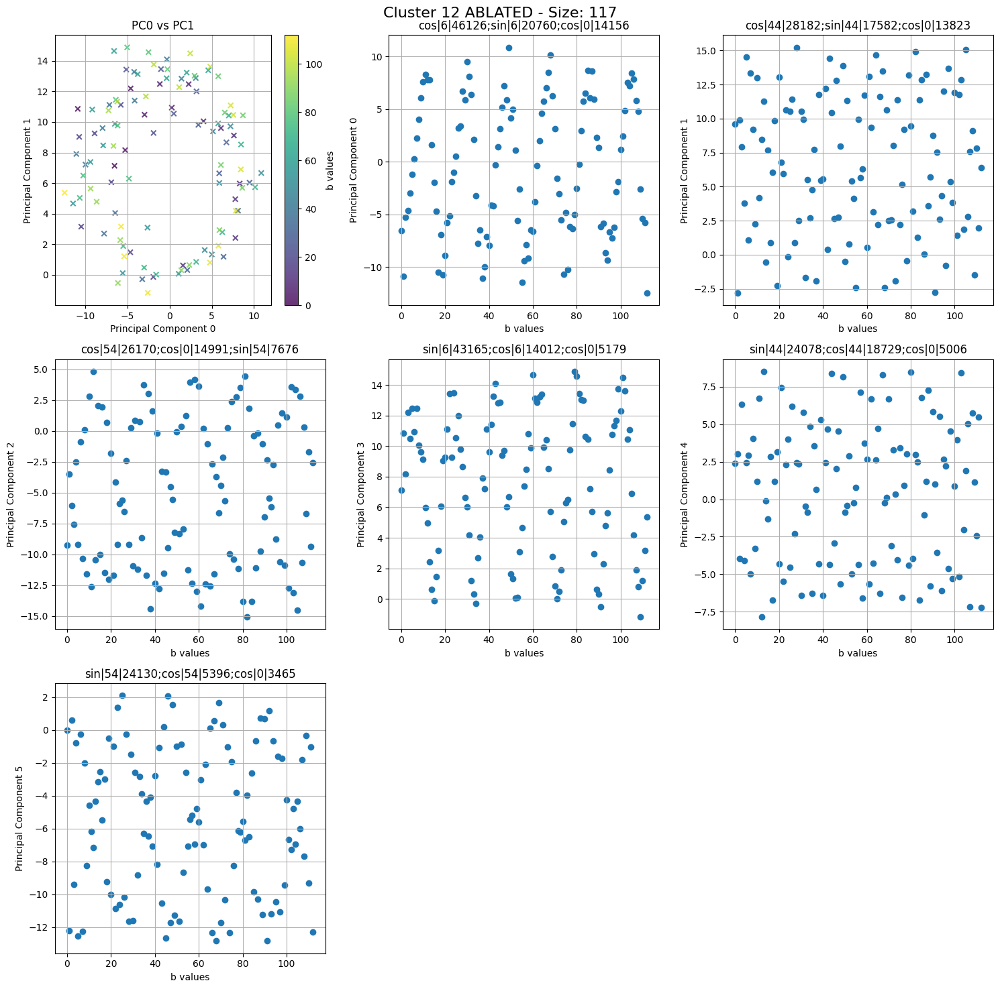

(12769, 6)


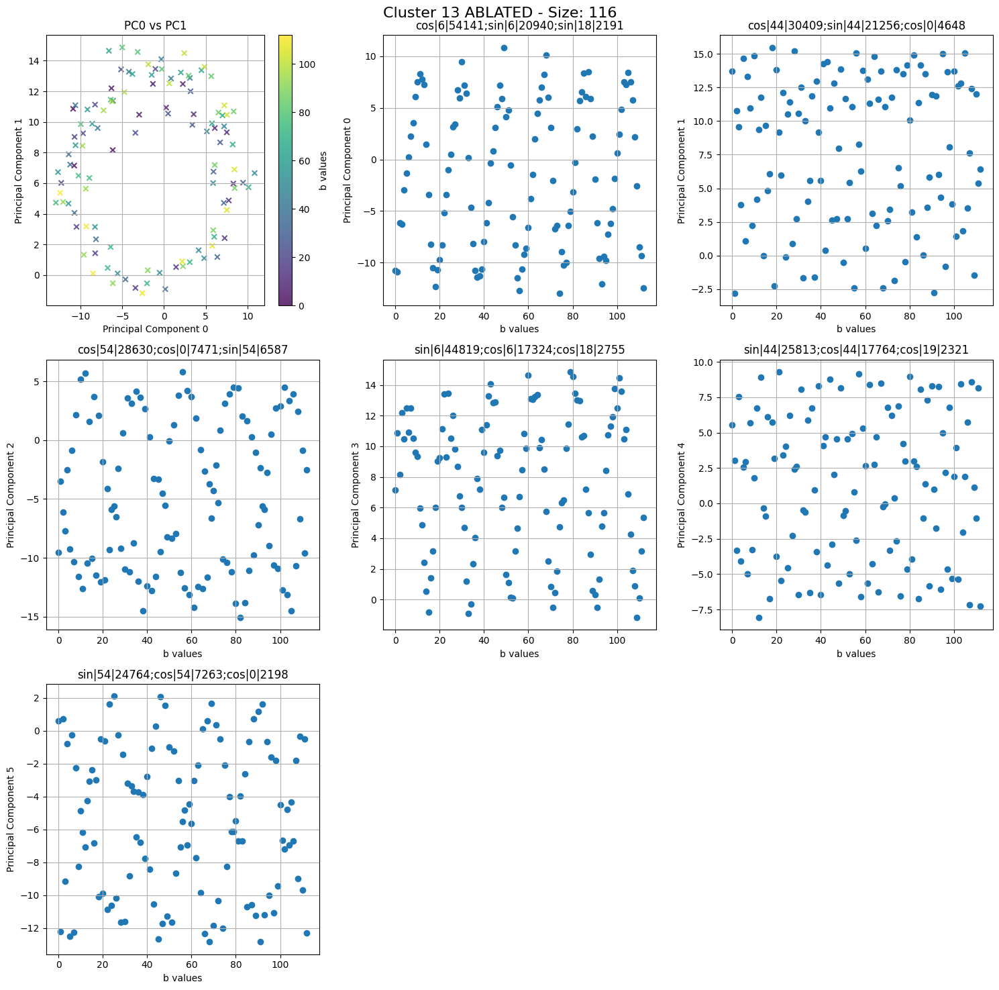

(12769, 6)


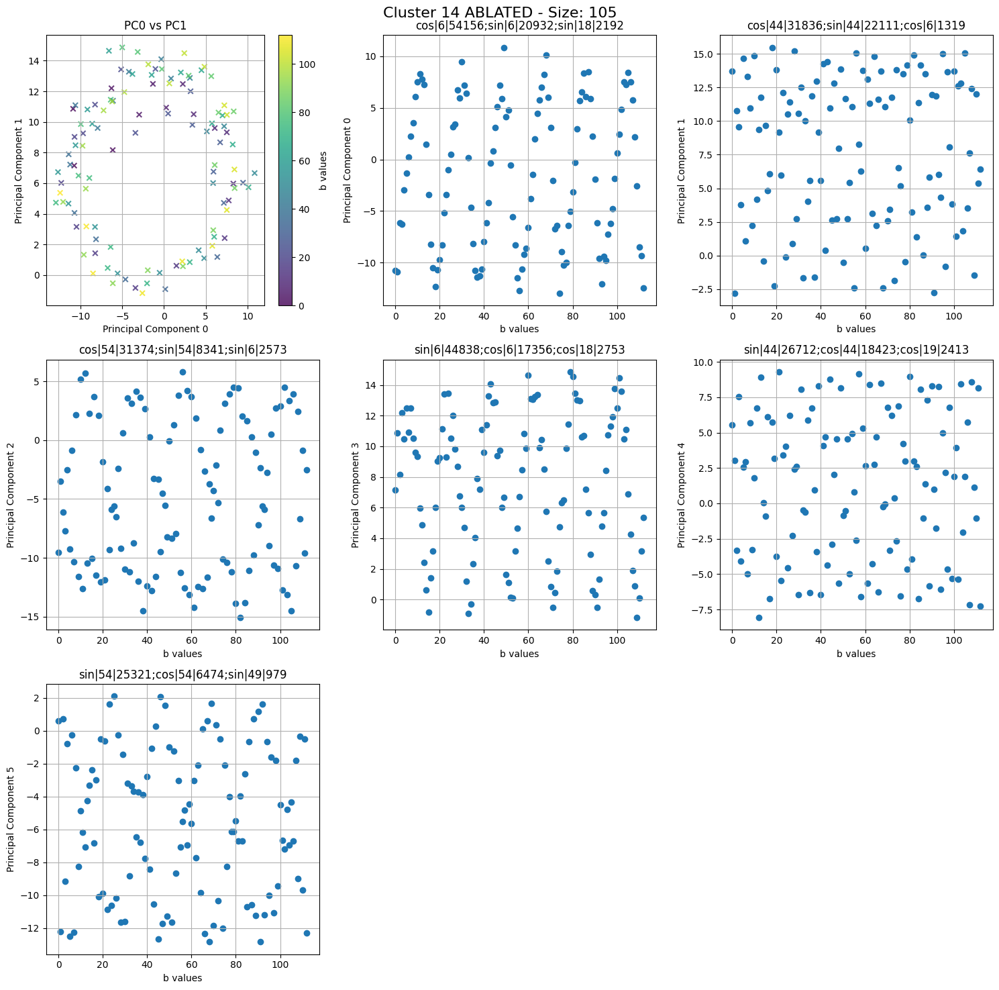

(12769, 6)


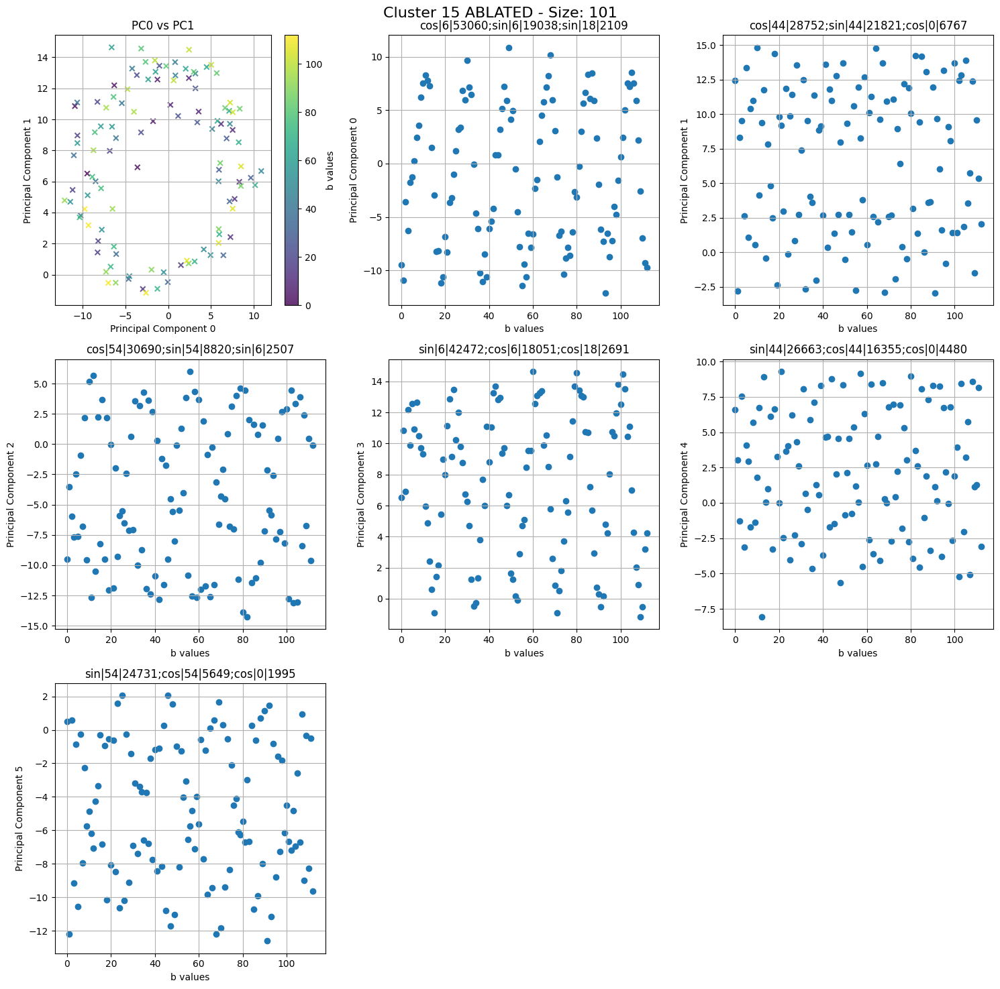

In [7]:
fixed_a = 5
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
#mlp truth
pca = PCA(n_components=6).fit(mlp_a_fixed)
output_pca = pca.transform(mlp_a_fixed)

top_freqs = utils.plot_pca_fourier_components(output_pca, plot=False)
print(top_freqs)

plt.subplot(3, 3, 1)
scatter = plt.scatter(output_pca[:, 0][fixed_a*113:fixed_a*113+113], output_pca[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()
plt.colorbar(scatter, label='b values')

plt.subplot(3, 3, 2)
plt.scatter(input_indices[:], output_pca[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[0][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 0")
plt.grid()

plt.subplot(3, 3, 3)
plt.scatter(input_indices[:], output_pca[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[1][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 1")
plt.grid()

plt.subplot(3, 3, 4)
plt.scatter(input_indices[:], output_pca[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[2][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 2")
plt.grid()

plt.subplot(3, 3, 5)
plt.scatter(input_indices[:], output_pca[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[3][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 3")
plt.grid()

plt.subplot(3, 3, 6)
plt.scatter(input_indices[:], output_pca[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[4][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 4")
plt.grid()

plt.subplot(3, 3, 7)
plt.scatter(input_indices[:], output_pca[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[5][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 5")
plt.grid()

#explained variance bar plot
plt.subplot(3, 3, 8)
plt.bar(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_, alpha=0.7)
plt.title("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.ylabel("Variance Ratio")
plt.xticks(range(len(pca.explained_variance_ratio_)))
plt.grid()

plt.suptitle(f"MLP Acts - PCA Analysis", fontsize=16)

plt.tight_layout()
plt.show()

#sae reconstructions
reconstructions = features @ decoder
recon_a = reconstructions.detach().cpu().numpy()
pca_sae = PCA(n_components=6).fit(recon_a)
output_pca_sae = pca_sae.transform(recon_a)
print(output_pca_sae.shape)
top_freqs_sae = utils.plot_pca_fourier_components(output_pca_sae, plot=False)

plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
scatter = plt.scatter(output_pca_sae[:, 0][fixed_a*113:fixed_a*113+113], output_pca_sae[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()
plt.colorbar(scatter, label='b values')

plt.subplot(3, 3, 2)
plt.scatter(input_indices[:113], output_pca_sae[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[0][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 0")
plt.grid()

plt.subplot(3, 3, 3)
plt.scatter(input_indices[:113], output_pca_sae[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[1][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 1")
plt.grid()

plt.subplot(3, 3, 4)
plt.scatter(input_indices[:113], output_pca_sae[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[2][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 2")
plt.grid()

plt.subplot(3, 3, 5)
plt.scatter(input_indices[:113], output_pca_sae[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[3][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 3")
plt.grid()

plt.subplot(3, 3, 6)
plt.scatter(input_indices[:113], output_pca_sae[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[4][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 4")
plt.grid()

plt.subplot(3, 3, 7)
plt.scatter(input_indices[:113], output_pca_sae[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[5][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 5")
plt.grid()

#explained variance bar plot
plt.subplot(3, 3, 8)
plt.bar(range(len(pca_sae.explained_variance_)), pca_sae.explained_variance_, alpha=0.7)
plt.title("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.ylabel("Variance Ratio")
plt.xticks(range(len(pca_sae.explained_variance_)))
plt.grid()

plt.suptitle(f"SAE Recon MLP Acts - PCA Analysis", fontsize=16)

plt.tight_layout()
plt.show()

for i in range(len(clusters)):
    # Create a copy of features to ablate
    features_ablated = features.clone()

    # Zero out the cluster features (ablation)
    features_ablated[:, clusters[i]] = 0

    # Reconstruct with the ablated features
    reconstructions = features_ablated @ decoder
    recon_a = reconstructions.detach().cpu().numpy()

    #pca_cluster = PCA(n_components=6).fit(recon_a)
    output_pca_cluster = pca_sae.transform(recon_a)
    print(output_pca_cluster.shape)
    top_freqs_cluster = utils.plot_pca_fourier_components(output_pca_cluster, plot=False)

    plt.figure(figsize=(15, 15))

    plt.subplot(3, 3, 1)
    scatter = plt.scatter(output_pca_cluster[:, 0][fixed_a*113:fixed_a*113+113], output_pca_cluster[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
    plt.title("PC0 vs PC1")
    plt.xlabel("Principal Component 0")
    plt.ylabel("Principal Component 1")
    plt.grid()
    plt.colorbar(scatter, label='b values')

    plt.subplot(3, 3, 2)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[0][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 0")
    plt.grid()

    plt.subplot(3, 3, 3)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[1][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 1")
    plt.grid()

    plt.subplot(3, 3, 4)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[2][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 2")
    plt.grid()
    
    plt.subplot(3, 3, 5)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[3][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 3")
    plt.grid()
    
    plt.subplot(3, 3, 6)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[4][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 4")
    plt.grid()

    plt.subplot(3, 3, 7)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[5][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 5")
    plt.grid()

    # Subplot 8: Explained variance
    """plt.subplot(3, 3, 8)
    plt.bar(range(len(pca_cluster.explained_variance_)), pca_cluster.explained_variance_, alpha=0.7)
    plt.title("Explained Variance Ratio")
    plt.xlabel("Principal Component")
    plt.ylabel("Variance Ratio")
    plt.xticks(range(len(pca_cluster.explained_variance_)))
    plt.grid()"""
    
    plt.suptitle(f"Cluster {i + 1} ABLATED - Size: {len(clusters[i])}", fontsize=16)

    plt.tight_layout()
    plt.show()

{0: [{'type': 'cos', 'frequency': 6, 'magnitude': 74309.68}, {'type': 'sin', 'frequency': 6, 'magnitude': 28010.193}, {'type': 'sin', 'frequency': 18, 'magnitude': 2173.0872}], 1: [{'type': 'cos', 'frequency': 44, 'magnitude': 44286.31}, {'type': 'sin', 'frequency': 44, 'magnitude': 30561.365}, {'type': 'cos', 'frequency': 6, 'magnitude': 1462.322}], 2: [{'type': 'cos', 'frequency': 54, 'magnitude': 43152.12}, {'type': 'sin', 'frequency': 54, 'magnitude': 11479.183}, {'type': 'sin', 'frequency': 6, 'magnitude': 1378.8523}], 3: [{'type': 'sin', 'frequency': 6, 'magnitude': 62672.27}, {'type': 'cos', 'frequency': 6, 'magnitude': 23687.092}, {'type': 'cos', 'frequency': 18, 'magnitude': 2227.5225}], 4: [{'type': 'sin', 'frequency': 44, 'magnitude': 37936.05}, {'type': 'cos', 'frequency': 44, 'magnitude': 26014.566}, {'type': 'cos', 'frequency': 19, 'magnitude': 2145.023}], 5: [{'type': 'sin', 'frequency': 54, 'magnitude': 36741.305}, {'type': 'cos', 'frequency': 54, 'magnitude': 9244.924}

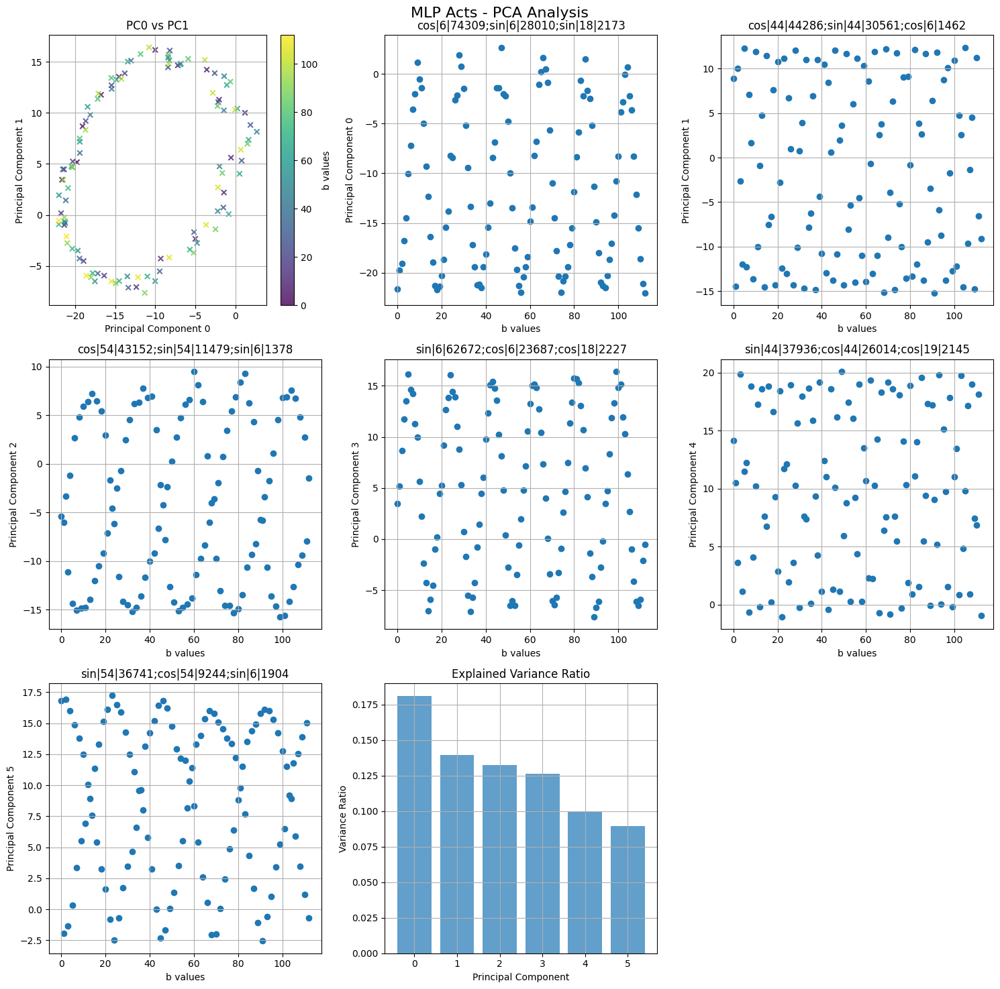

(12769, 6)


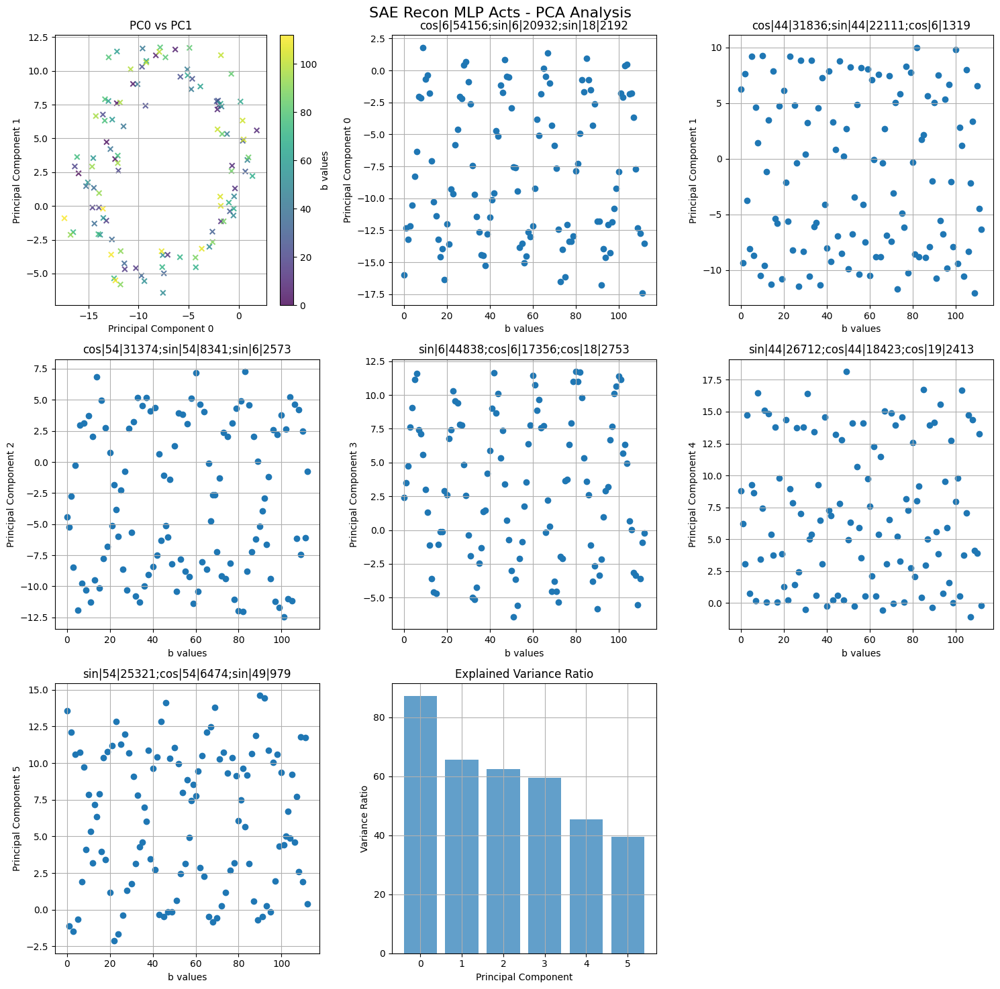

(12769, 6)


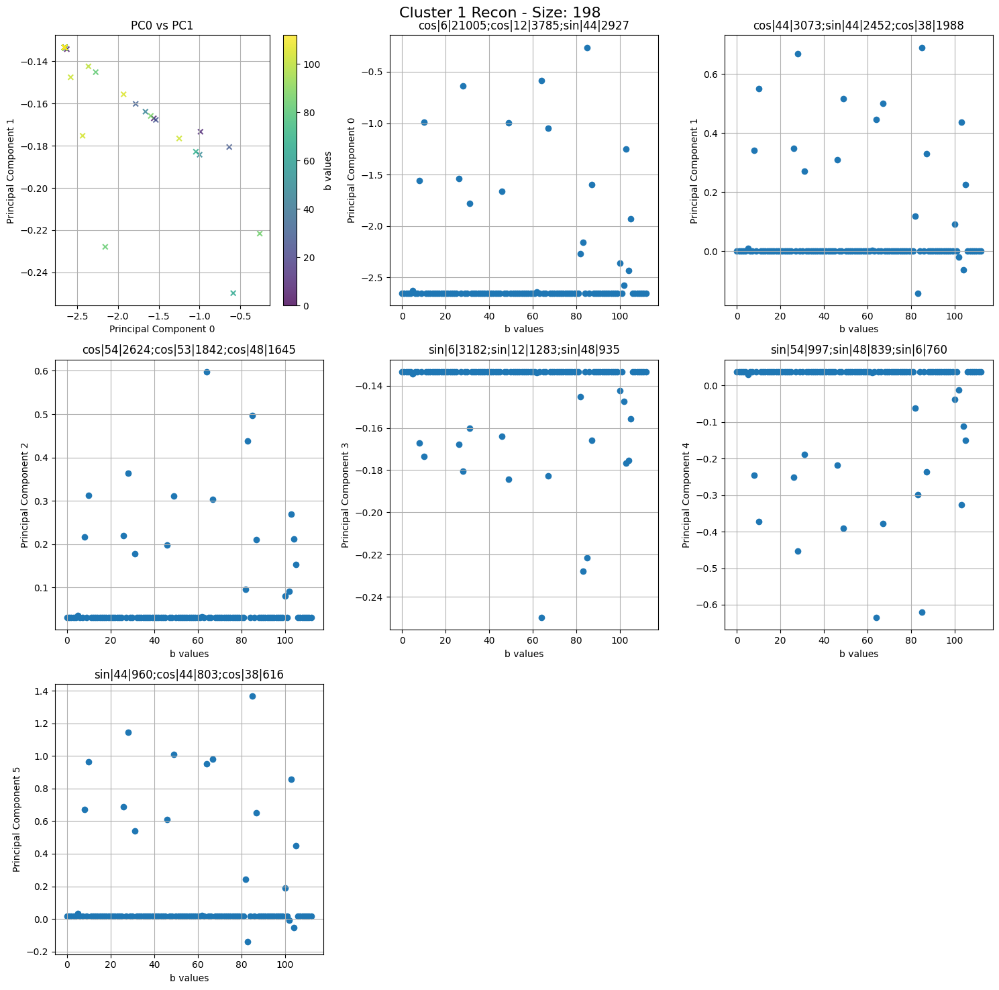

(12769, 6)


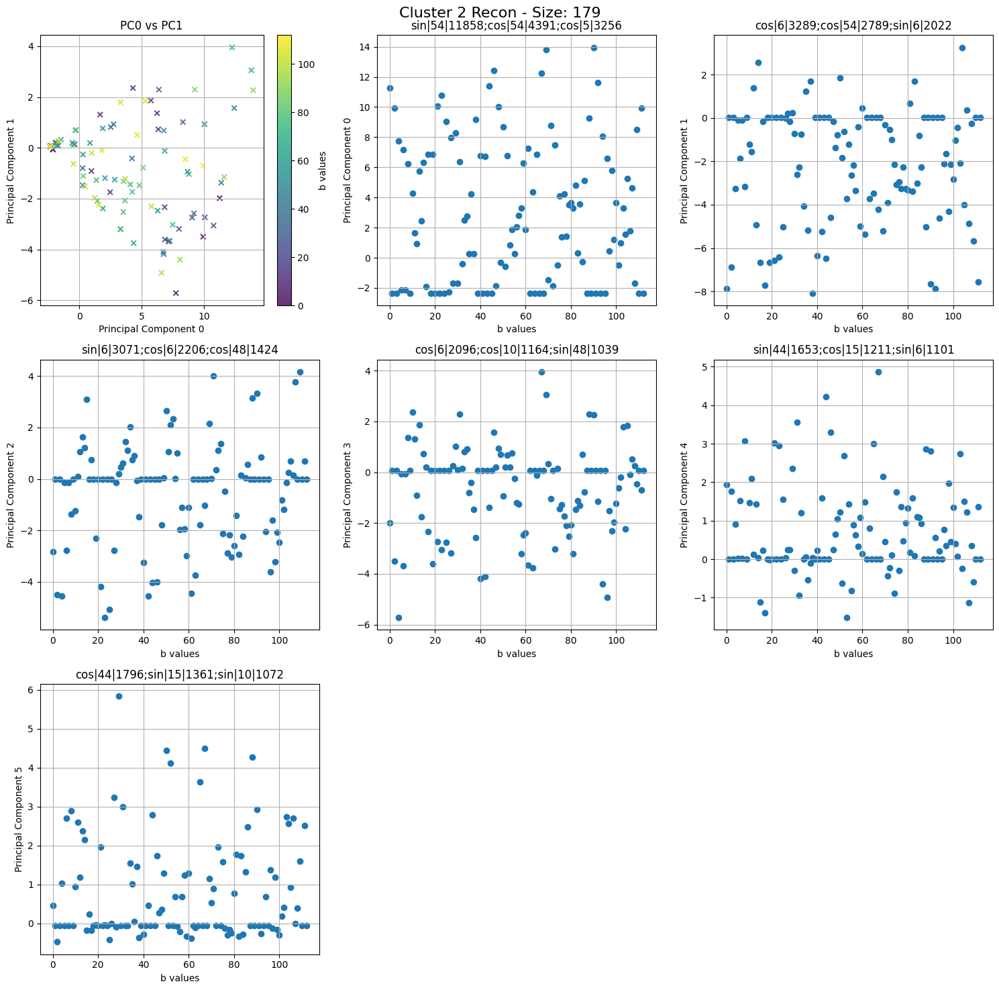

(12769, 6)


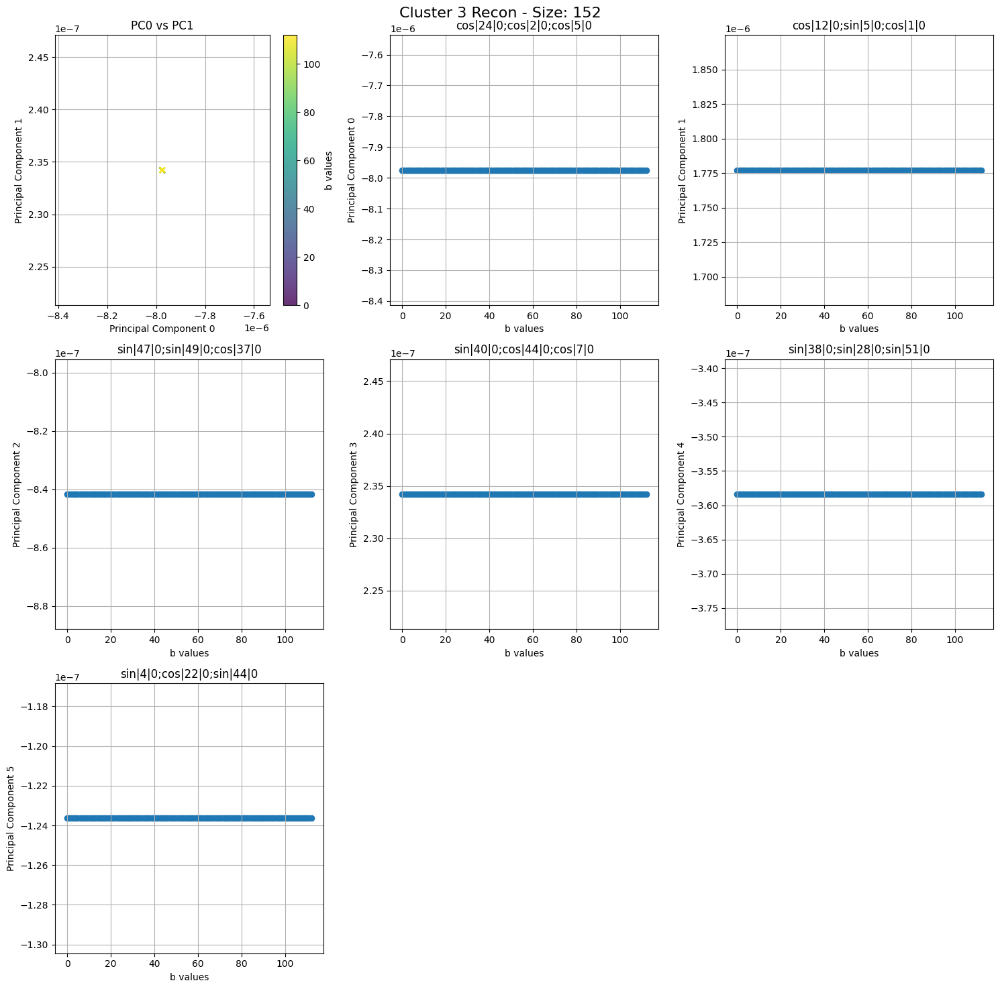

(12769, 6)


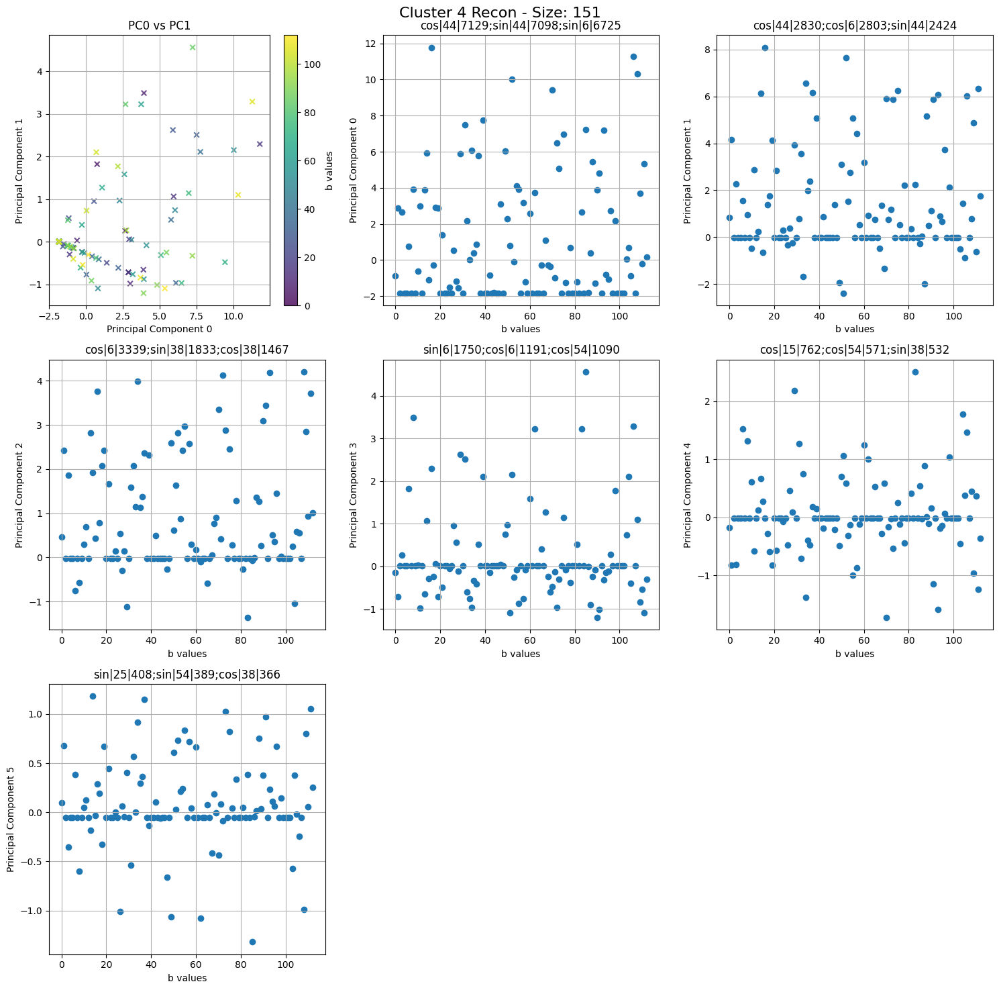

(12769, 6)


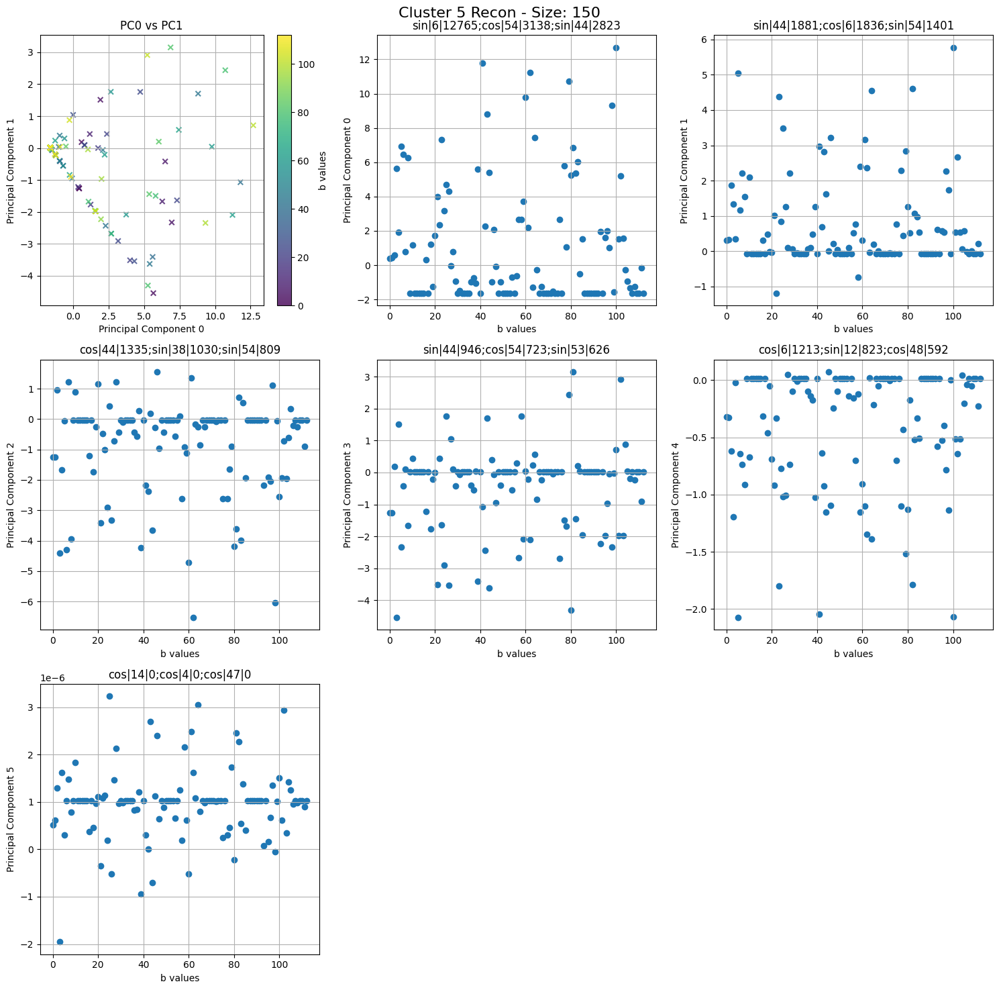

(12769, 6)


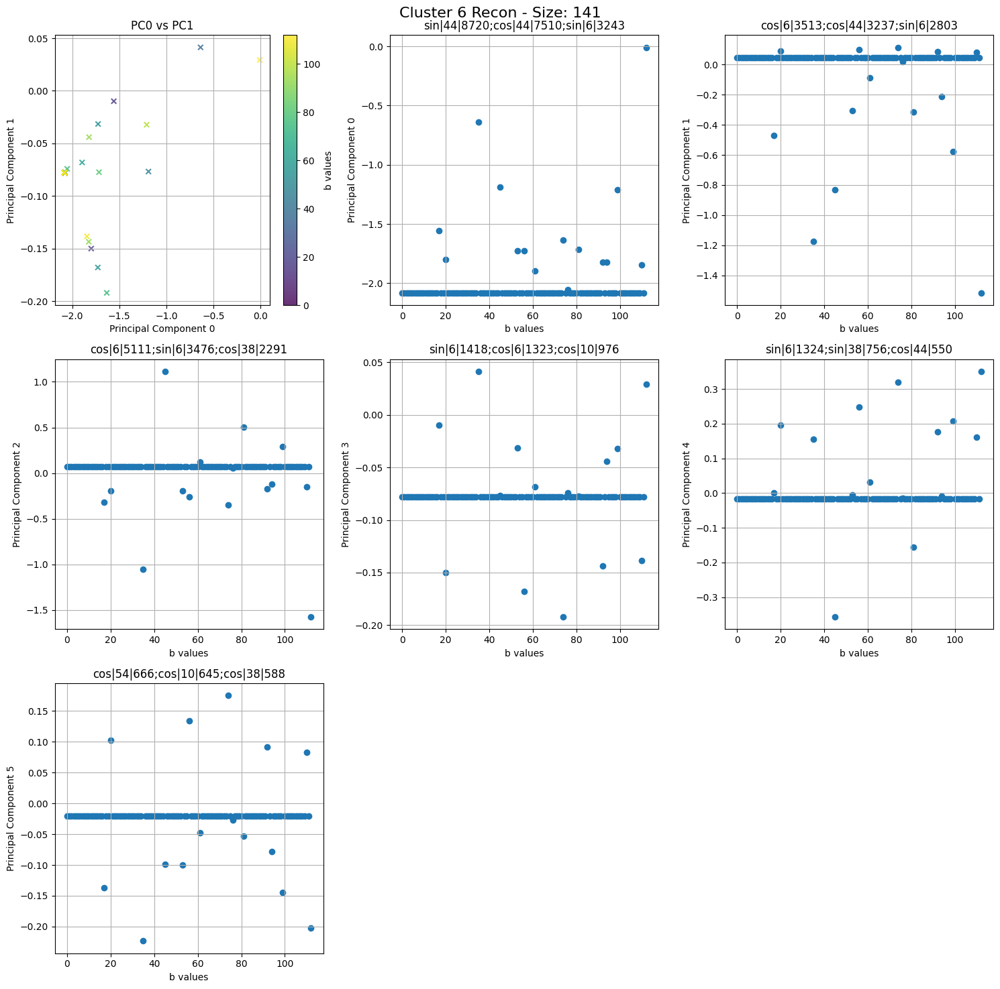

(12769, 6)


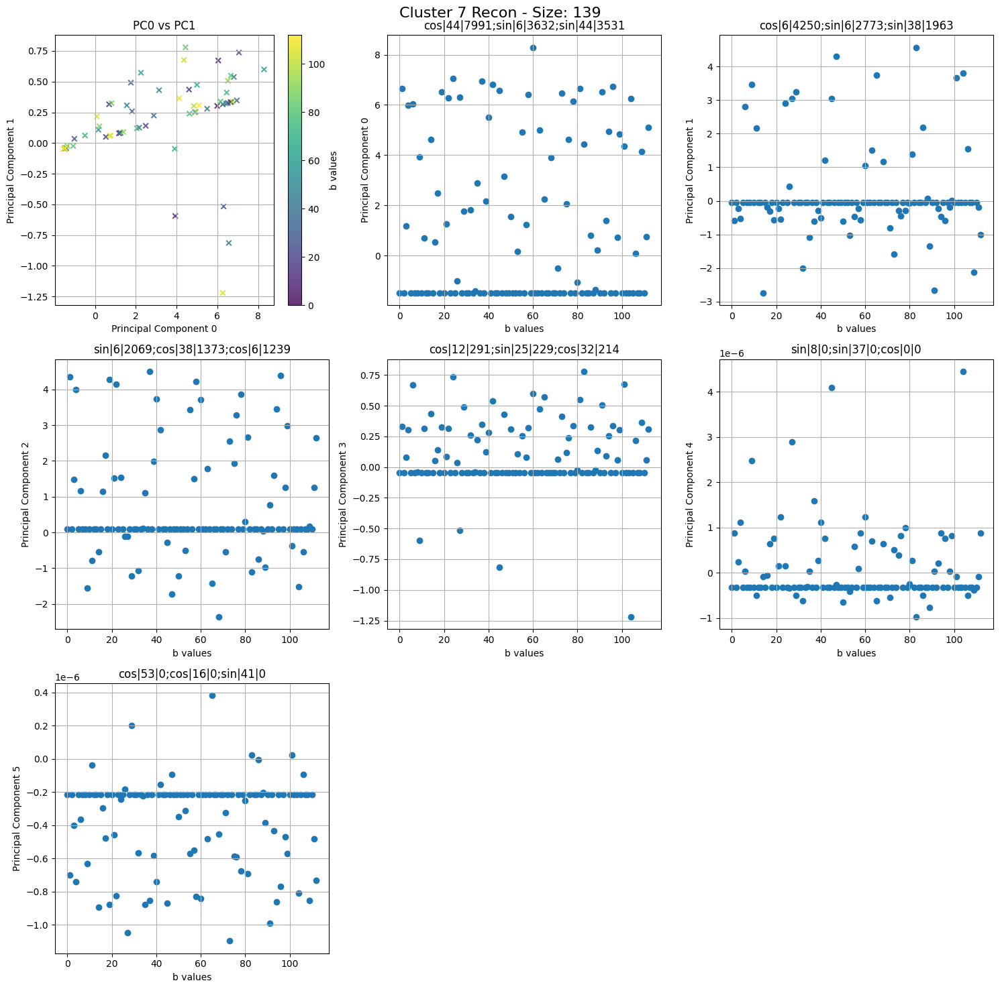

(12769, 6)


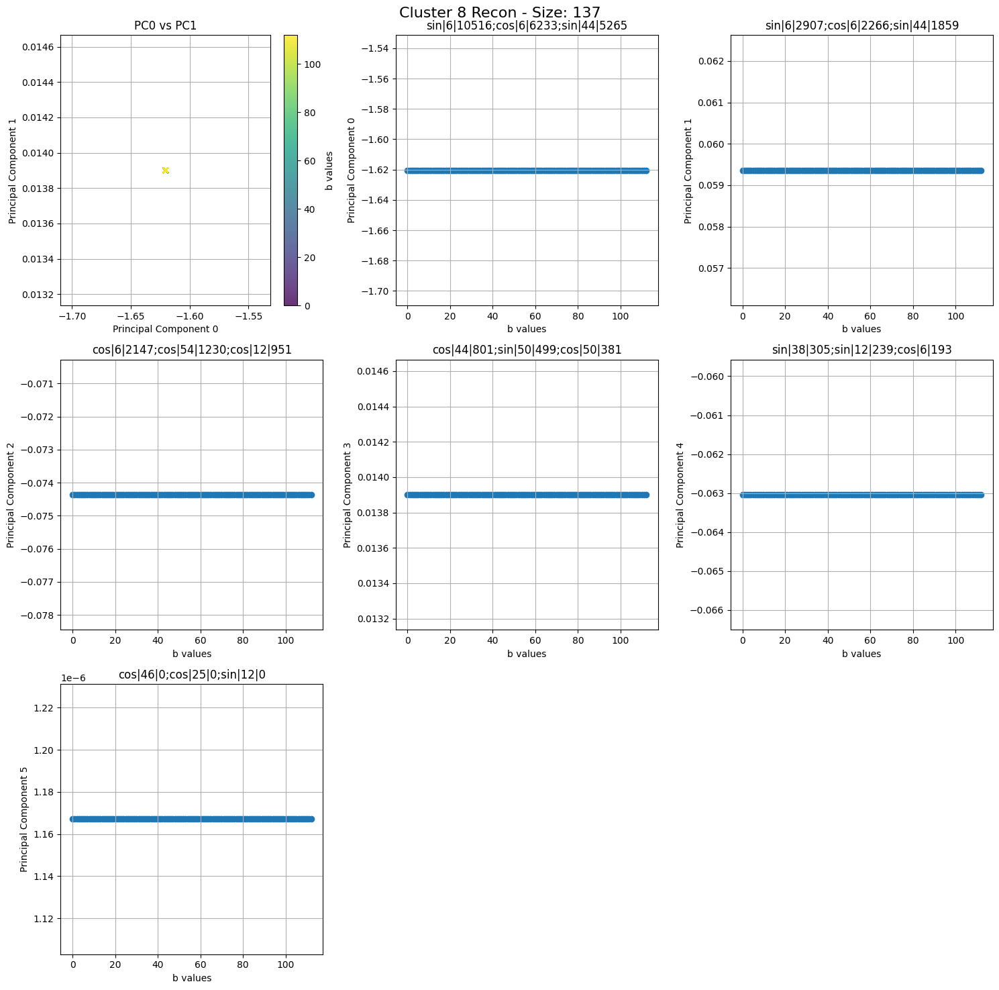

(12769, 6)


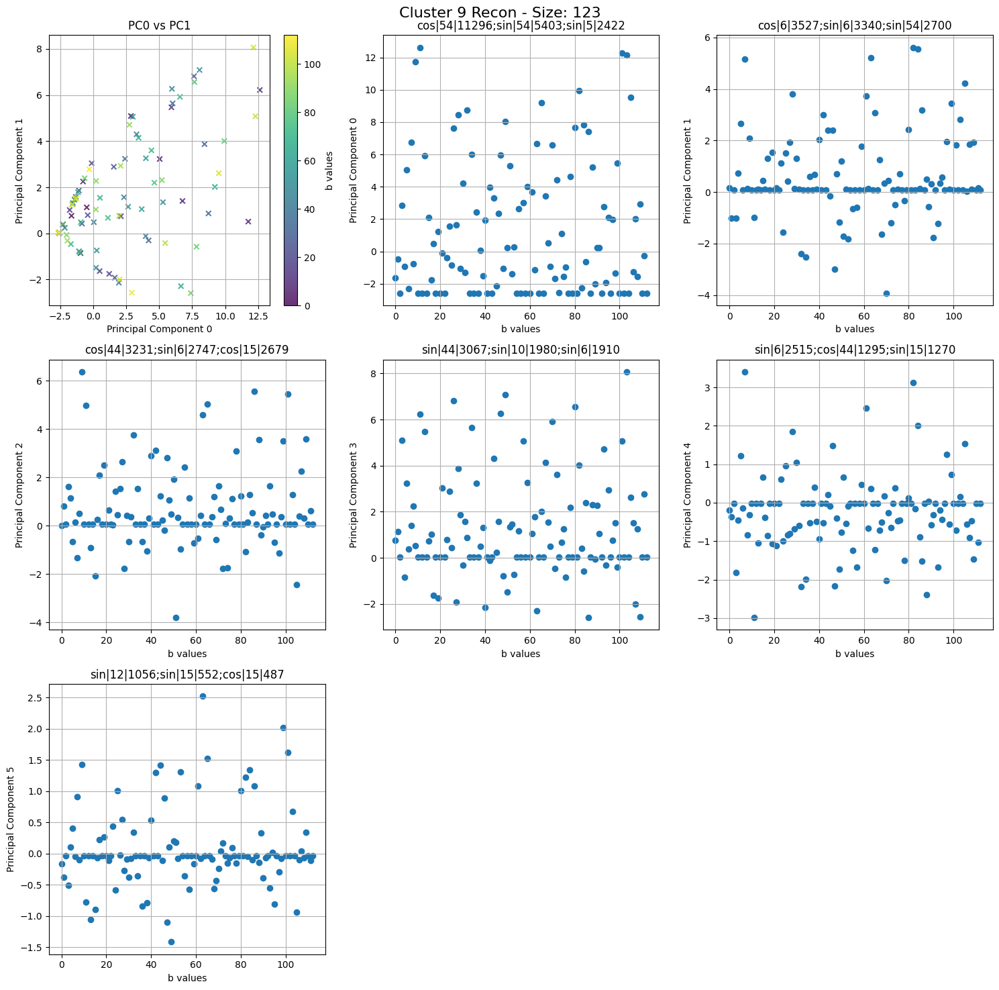

(12769, 6)


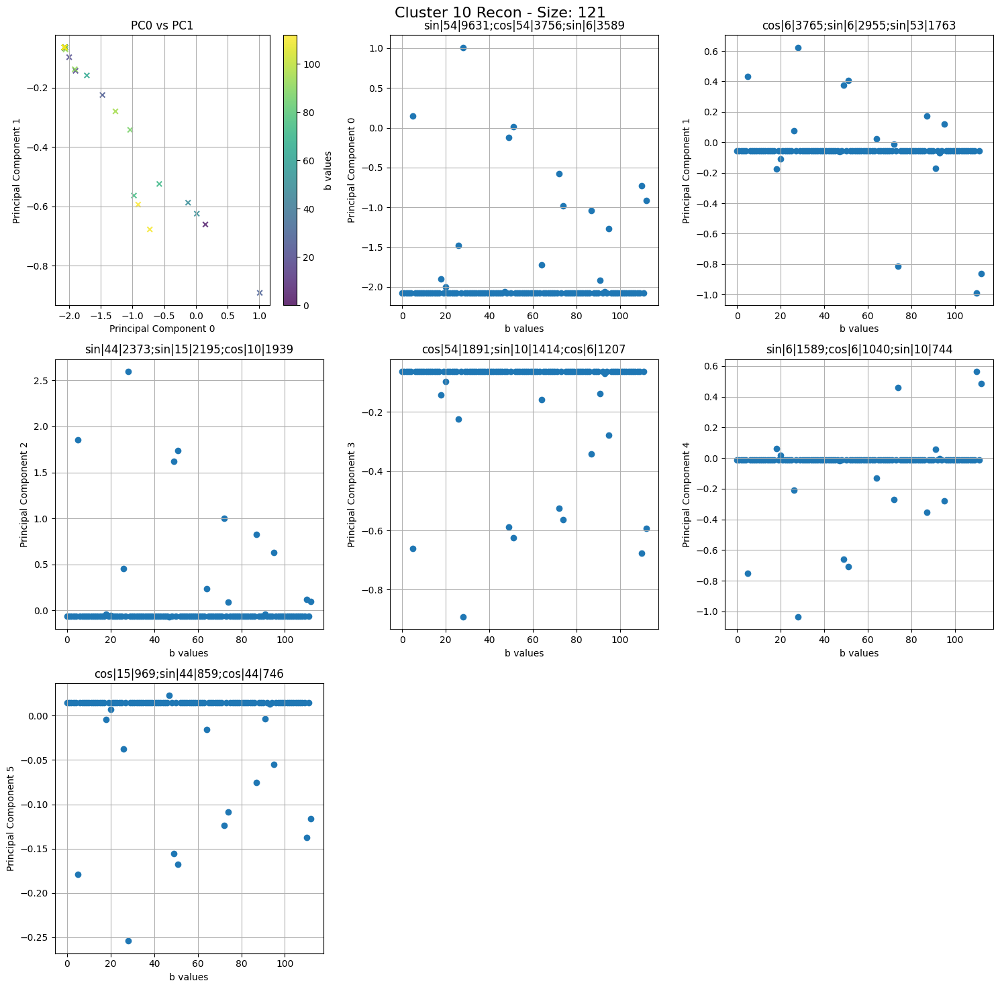

(12769, 6)


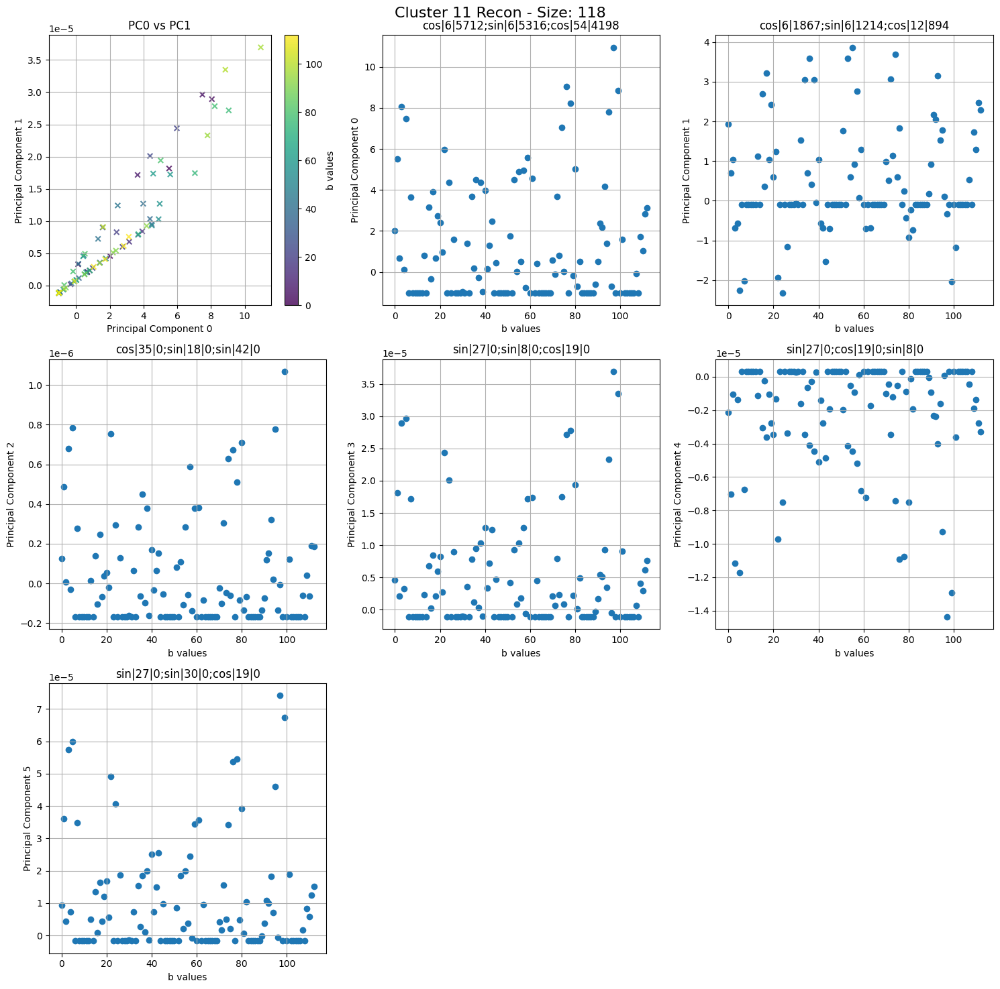

(12769, 6)


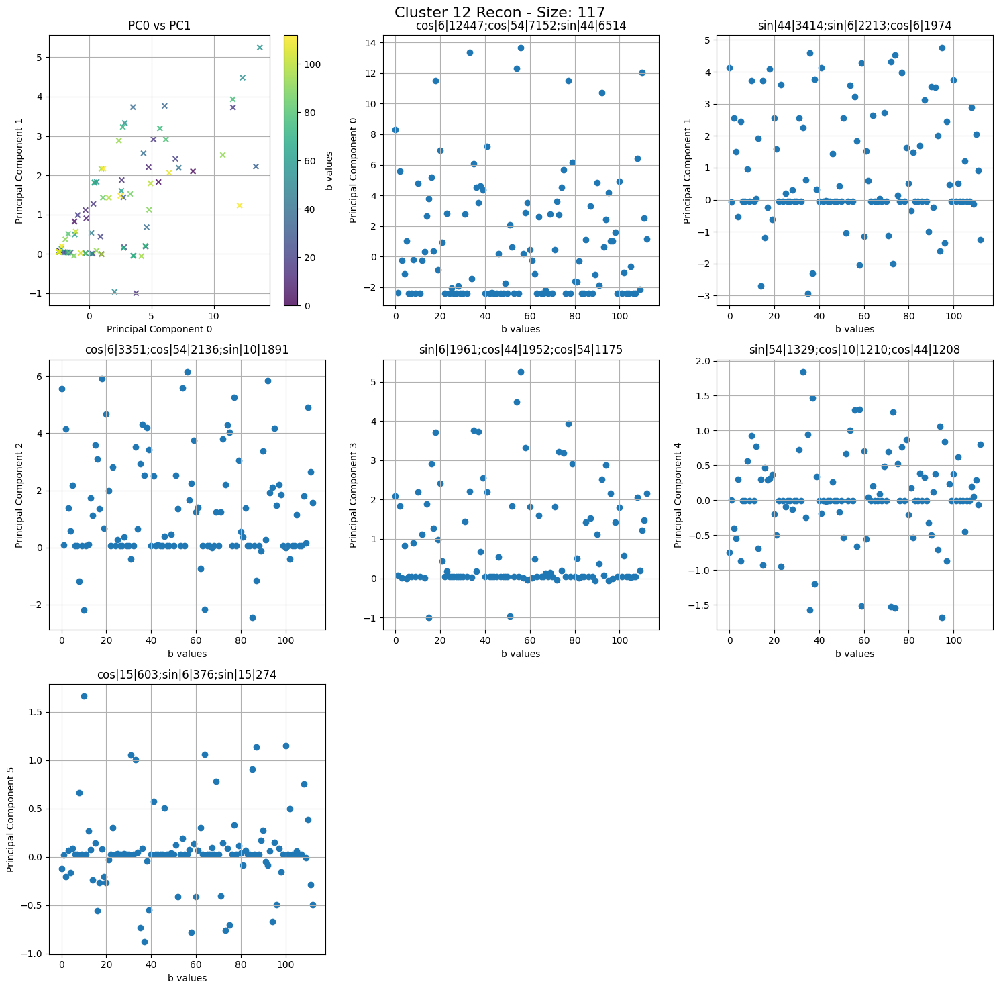

(12769, 6)


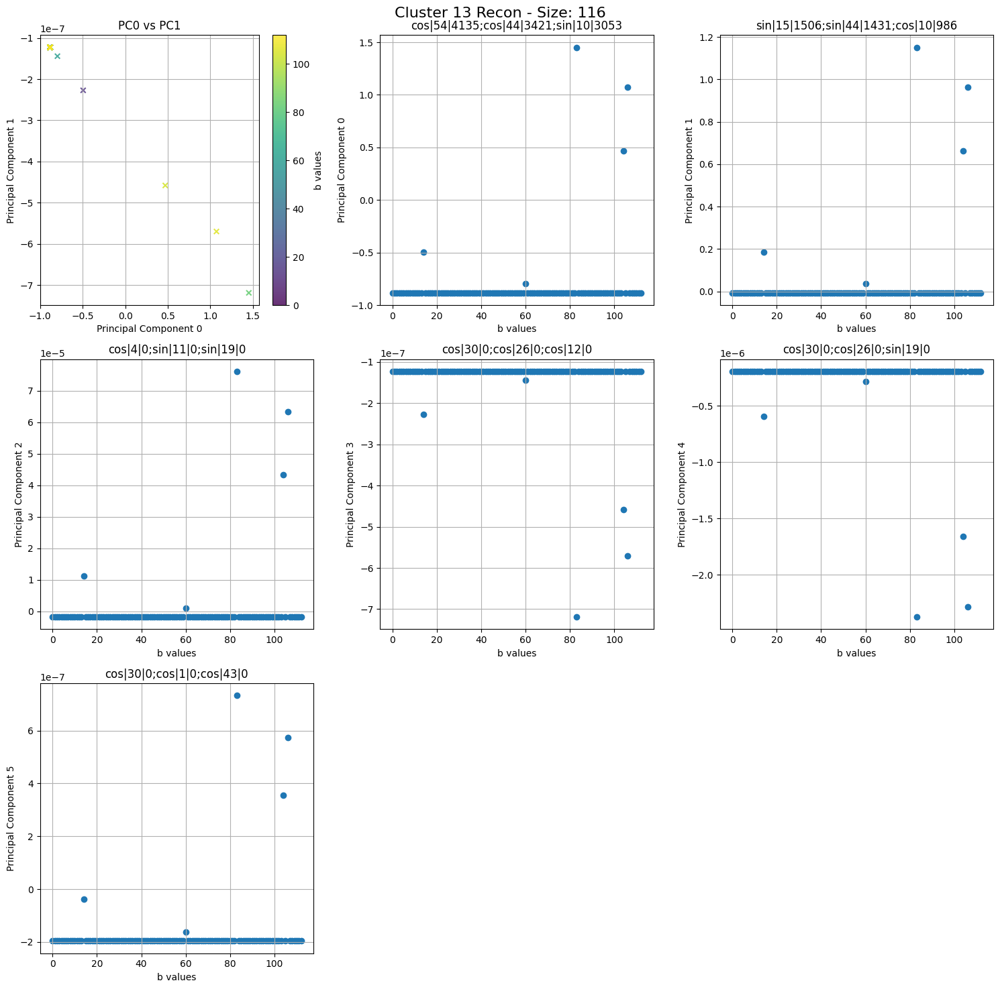

(12769, 6)


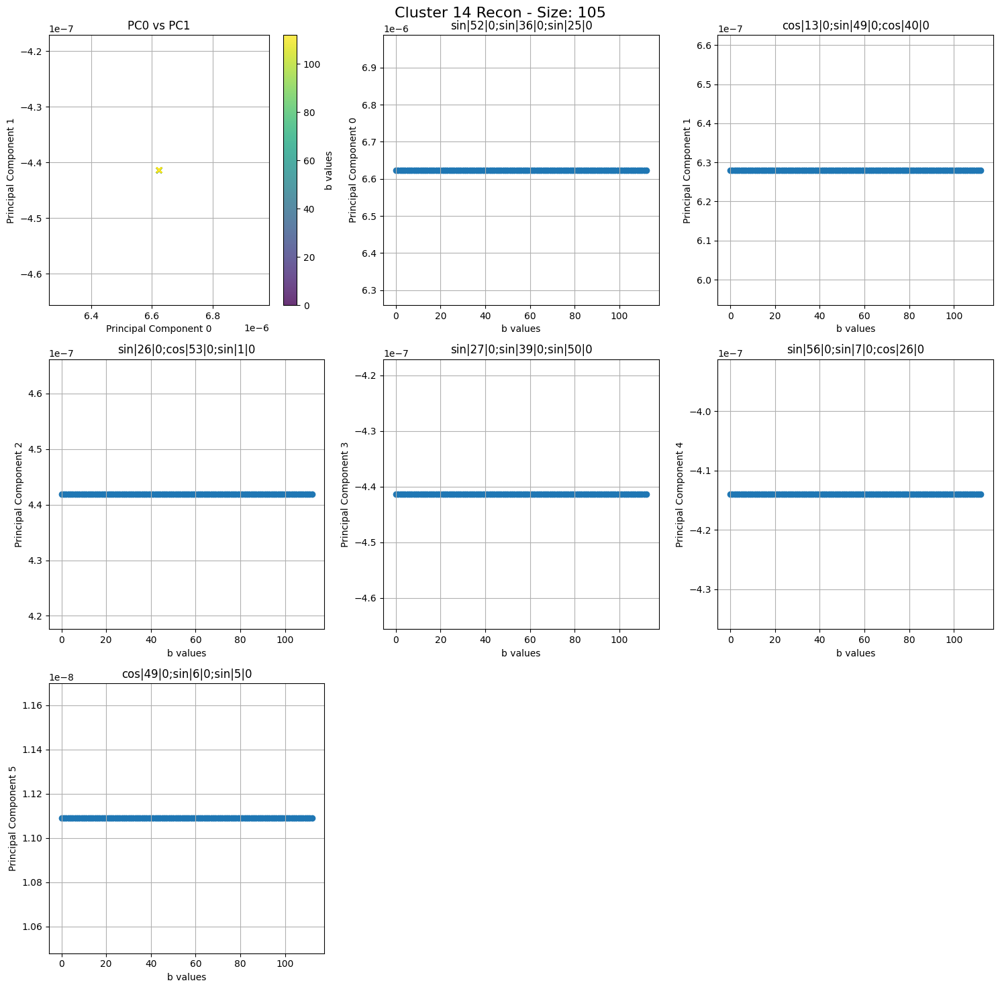

(12769, 6)


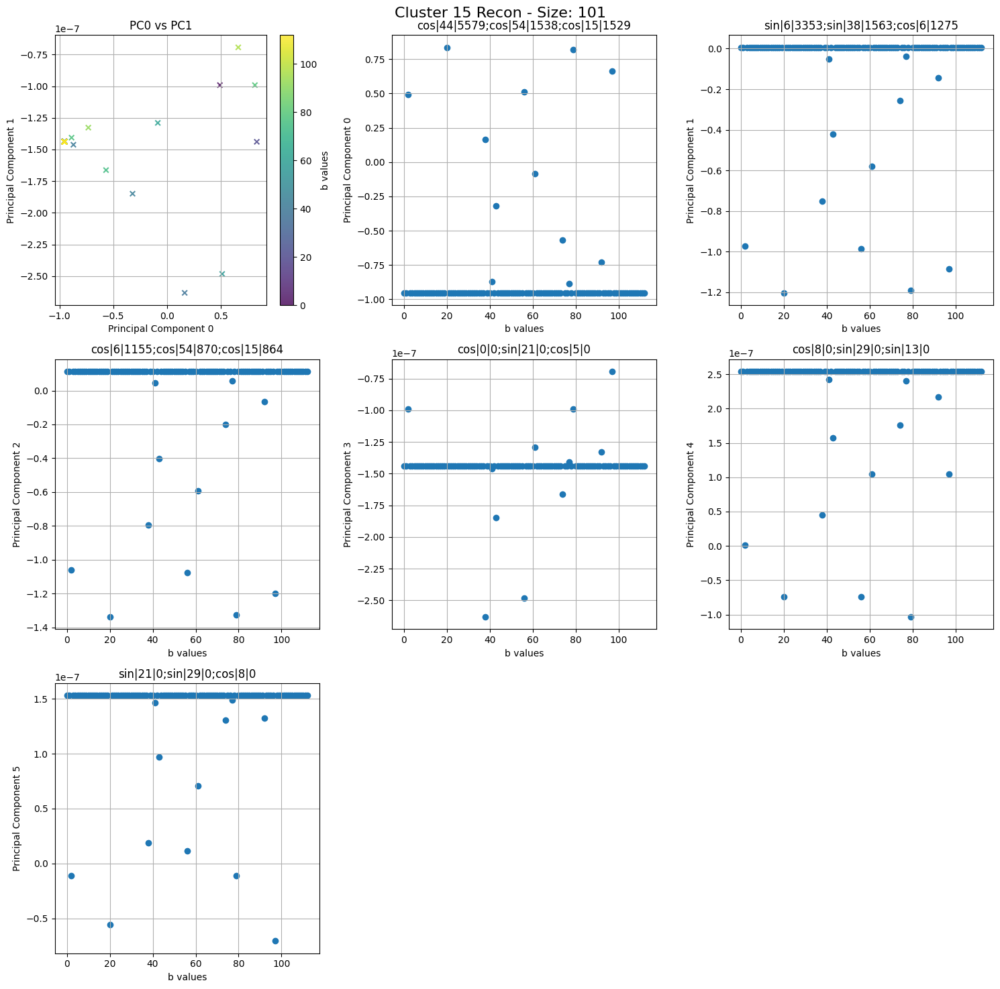

In [8]:
fixed_a = 21
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
#mlp truth
pca = PCA(n_components=6).fit(mlp_a_fixed)
output_pca = pca.transform(mlp_a_fixed)

top_freqs = utils.plot_pca_fourier_components(output_pca, plot=False)
print(top_freqs)

plt.subplot(3, 3, 1)
scatter = plt.scatter(output_pca[:, 0][fixed_a*113:fixed_a*113+113], output_pca[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()
plt.colorbar(scatter, label='b values')

plt.subplot(3, 3, 2)
plt.scatter(input_indices[:], output_pca[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[0][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 0")
plt.grid()

plt.subplot(3, 3, 3)
plt.scatter(input_indices[:], output_pca[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[1][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 1")
plt.grid()

plt.subplot(3, 3, 4)
plt.scatter(input_indices[:], output_pca[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[2][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 2")
plt.grid()

plt.subplot(3, 3, 5)
plt.scatter(input_indices[:], output_pca[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[3][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 3")
plt.grid()

plt.subplot(3, 3, 6)
plt.scatter(input_indices[:], output_pca[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[4][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 4")
plt.grid()

plt.subplot(3, 3, 7)
plt.scatter(input_indices[:], output_pca[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs[5][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 5")
plt.grid()

#explained variance bar plot
plt.subplot(3, 3, 8)
plt.bar(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_, alpha=0.7)
plt.title("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.ylabel("Variance Ratio")
plt.xticks(range(len(pca.explained_variance_ratio_)))
plt.grid()

plt.suptitle(f"MLP Acts - PCA Analysis", fontsize=16)

plt.tight_layout()
plt.show()

#sae reconstructions
reconstructions = features @ decoder
recon_a = reconstructions.detach().cpu().numpy()
pca_sae = PCA(n_components=6).fit(recon_a)
output_pca_sae = pca_sae.transform(recon_a)
print(output_pca_sae.shape)
top_freqs_sae = utils.plot_pca_fourier_components(output_pca_sae, plot=False)

plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
scatter = plt.scatter(output_pca_sae[:, 0][fixed_a*113:fixed_a*113+113], output_pca_sae[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()
plt.colorbar(scatter, label='b values')

plt.subplot(3, 3, 2)
plt.scatter(input_indices[:113], output_pca_sae[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[0][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 0")
plt.grid()

plt.subplot(3, 3, 3)
plt.scatter(input_indices[:113], output_pca_sae[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[1][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 1")
plt.grid()

plt.subplot(3, 3, 4)
plt.scatter(input_indices[:113], output_pca_sae[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[2][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 2")
plt.grid()

plt.subplot(3, 3, 5)
plt.scatter(input_indices[:113], output_pca_sae[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[3][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 3")
plt.grid()

plt.subplot(3, 3, 6)
plt.scatter(input_indices[:113], output_pca_sae[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[4][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 4")
plt.grid()

plt.subplot(3, 3, 7)
plt.scatter(input_indices[:113], output_pca_sae[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_sae[5][:3]))
plt.xlabel("b values")
plt.ylabel("Principal Component 5")
plt.grid()

#explained variance bar plot
plt.subplot(3, 3, 8)
plt.bar(range(len(pca_sae.explained_variance_)), pca_sae.explained_variance_, alpha=0.7)
plt.title("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.ylabel("Variance Ratio")
plt.xticks(range(len(pca_sae.explained_variance_)))
plt.grid()

plt.suptitle(f"SAE Recon MLP Acts - PCA Analysis", fontsize=16)

plt.tight_layout()
plt.show()

for i in range(len(clusters)):
    # Create a copy of features to ablate
    features_cluster = features.clone()

    # only use the features in the current cluster
    features_cluster = features_cluster[:, clusters[i]]
    decoder_cluster = decoder[clusters[i], :]

    # Reconstruct with the ablated features
    reconstructions = features_cluster @ decoder_cluster
    recon_a = reconstructions.detach().cpu().numpy()

    pca_cluster = PCA(n_components=6).fit(recon_a)
    output_pca_cluster = pca_cluster.transform(recon_a)
    print(output_pca_cluster.shape)
    top_freqs_cluster = utils.plot_pca_fourier_components(output_pca_cluster, plot=False)

    plt.figure(figsize=(15, 15))

    plt.subplot(3, 3, 1)
    scatter = plt.scatter(output_pca_cluster[:, 0][fixed_a*113:fixed_a*113+113], output_pca_cluster[:, 3][fixed_a*113:fixed_a*113+113], marker='x', c=mod_additions[:113], s=30, alpha=0.8, cmap='viridis')
    plt.title("PC0 vs PC1")
    plt.xlabel("Principal Component 0")
    plt.ylabel("Principal Component 1")
    plt.grid()
    plt.colorbar(scatter, label='b values')

    plt.subplot(3, 3, 2)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 0][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[0][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 0")
    plt.grid()

    plt.subplot(3, 3, 3)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 1][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[1][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 1")
    plt.grid()

    plt.subplot(3, 3, 4)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 2][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[2][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 2")
    plt.grid()
    
    plt.subplot(3, 3, 5)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 3][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[3][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 3")
    plt.grid()
    
    plt.subplot(3, 3, 6)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 4][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[4][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 4")
    plt.grid()

    plt.subplot(3, 3, 7)
    plt.scatter(input_indices[:113], output_pca_cluster[:, 5][fixed_a*113:fixed_a*113+113], marker='o')
    plt.title(";".join(f"{freq['type']}|{freq['frequency']}|{int(freq['magnitude'])}" 
                   for freq in top_freqs_cluster[5][:3]))
    plt.xlabel("b values")
    plt.ylabel("Principal Component 5")
    plt.grid()

    # Subplot 8: Explained variance
    """plt.subplot(3, 3, 8)
    plt.bar(range(len(pca_cluster.explained_variance_)), pca_cluster.explained_variance_, alpha=0.7)
    plt.title("Explained Variance Ratio")
    plt.xlabel("Principal Component")
    plt.ylabel("Variance Ratio")
    plt.xticks(range(len(pca_cluster.explained_variance_)))
    plt.grid()"""
    
    plt.suptitle(f"Cluster {i + 1} Recon - Size: {len(clusters[i])}", fontsize=16)

    plt.tight_layout()
    plt.show()

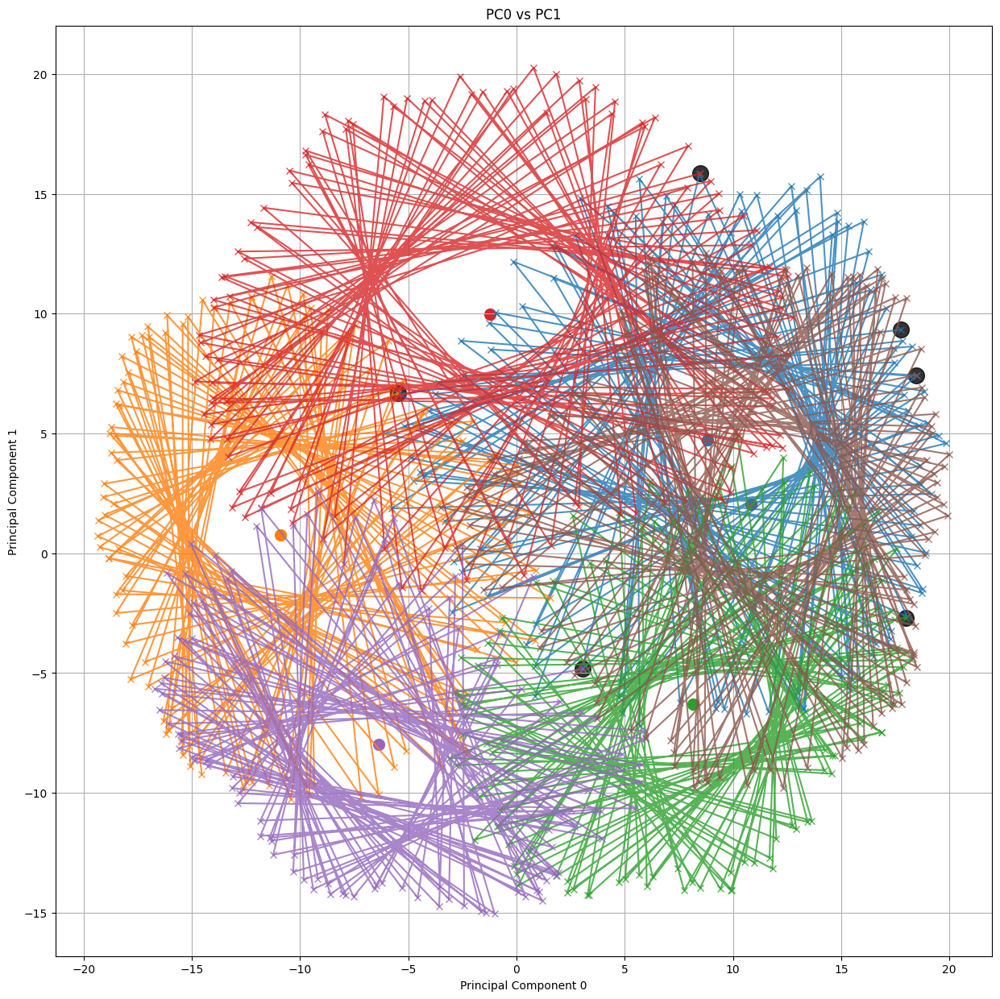

In [9]:
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
#mlp truth
pca = PCA(n_components=6).fit(mlp_a_fixed)
output_pca = pca.transform(mlp_a_fixed)

for a in range(6):
    plt.plot(output_pca[:, 1][a*113:a*113+113], output_pca[:, 4][a*113:a*113+113], marker='x', alpha=0.8)
    #plot center of mass
    center_x = np.mean(output_pca[:, 1][a*113:a*113+113])
    center_y = np.mean(output_pca[:, 4][a*113:a*113+113])
    plt.scatter(center_x, center_y, marker='o', s=100, label=f'Center {a}' if a == 0 else "")
    plt.scatter(output_pca[:, 1][a*113], output_pca[:, 4][a*113], marker='o', color='black', s=200, alpha=0.8)

plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()

plt.show()

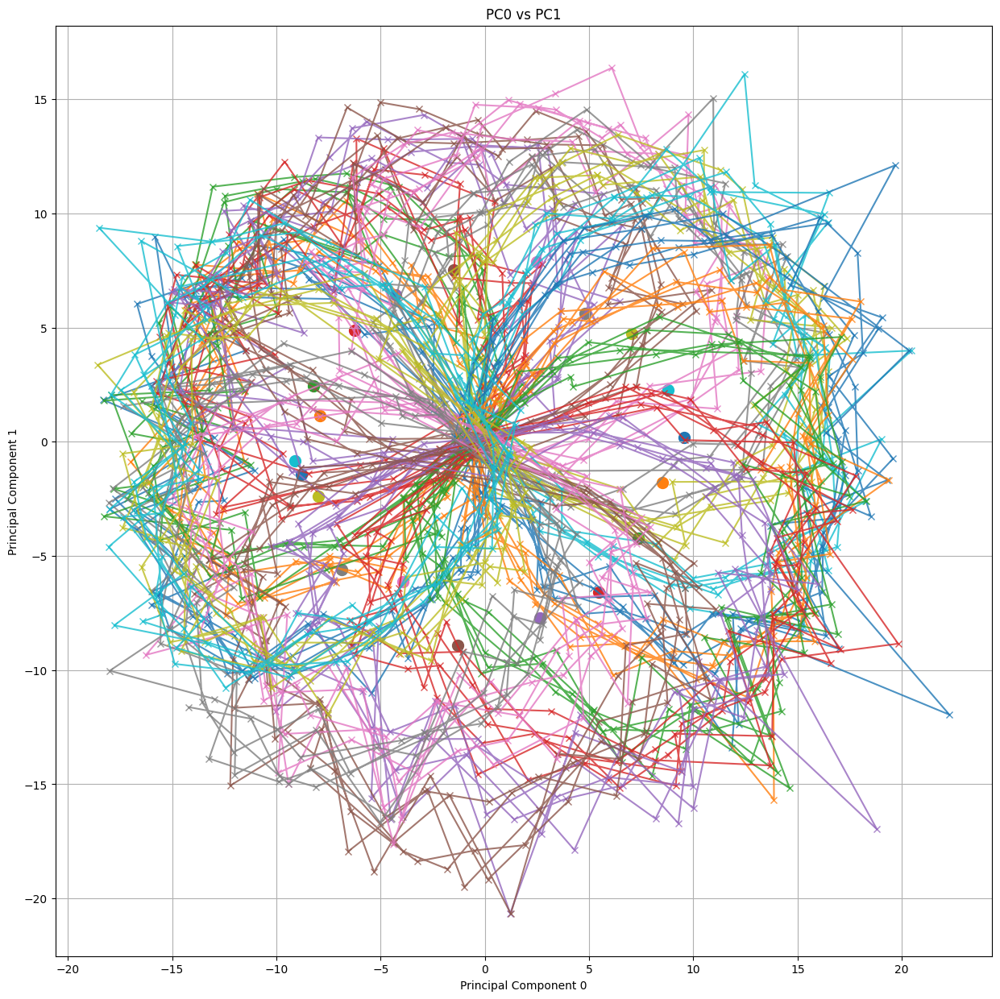

In [10]:


plt.figure(figsize=(15, 15))
#mlp truth
reconstructions = features @ decoder
recon_a = reconstructions.detach().cpu().numpy()
pca_sae = PCA(n_components=6).fit(recon_a)
output_pca_sae = pca_sae.transform(recon_a)

for a in range(20):
    plt.plot(output_pca_sae[:, 0][a*113:a*113+113], output_pca_sae[:, 3][a*113:a*113+113], marker='x', alpha=0.8)
    #plot center of mass
    center_x = np.mean(output_pca_sae[:, 0][a*113:a*113+113])
    center_y = np.mean(output_pca_sae[:, 3][a*113:a*113+113])
    plt.scatter(center_x, center_y, marker='o', s=100, label=f'Center {a}' if a == 0 else "")

plt.title("PC0 vs PC1")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 1")
plt.grid()

plt.show()

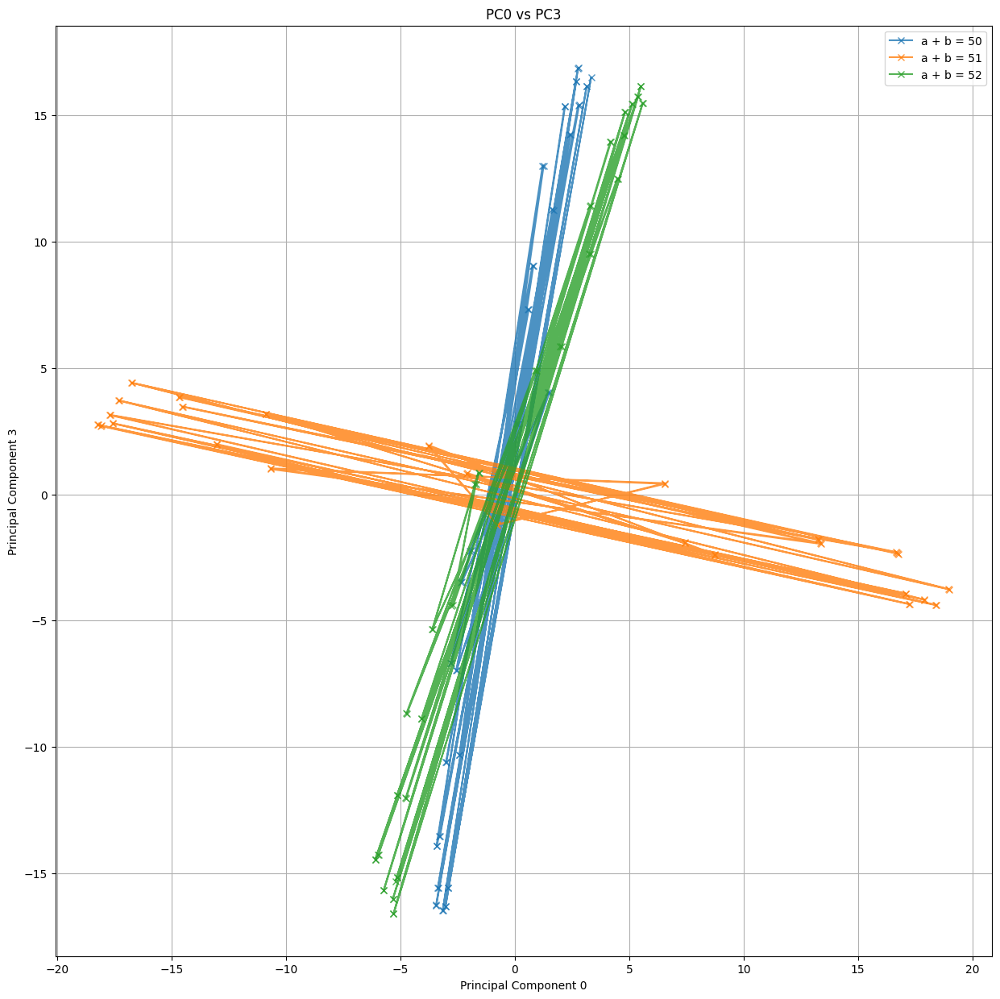

In [19]:
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
#mlp truth
pca = PCA(n_components=6).fit(mlp_a_fixed)
output_pca = pca.transform(mlp_a_fixed)

a_values = np.arange(113)
b_values = np.arange(113)


inputs = np.array([[a_i, 113, b_i, 114] for a_i in a_values for b_i in b_values])

# Find indices where a_i + b_i == 75
# a_i is in column 0, b_i is in column 2
for i in [50, 51, 52]:
    indices = np.where(inputs[:, 0] + inputs[:, 2] == i)[0]
    plt.plot(output_pca[:, 2][indices], output_pca[:, 5][indices], marker='x', alpha=0.8, label=f'a + b = {i}')


plt.title("PC0 vs PC3")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 3")
plt.legend()
plt.grid()

plt.show()

(2048, 512)
(2048, 6)


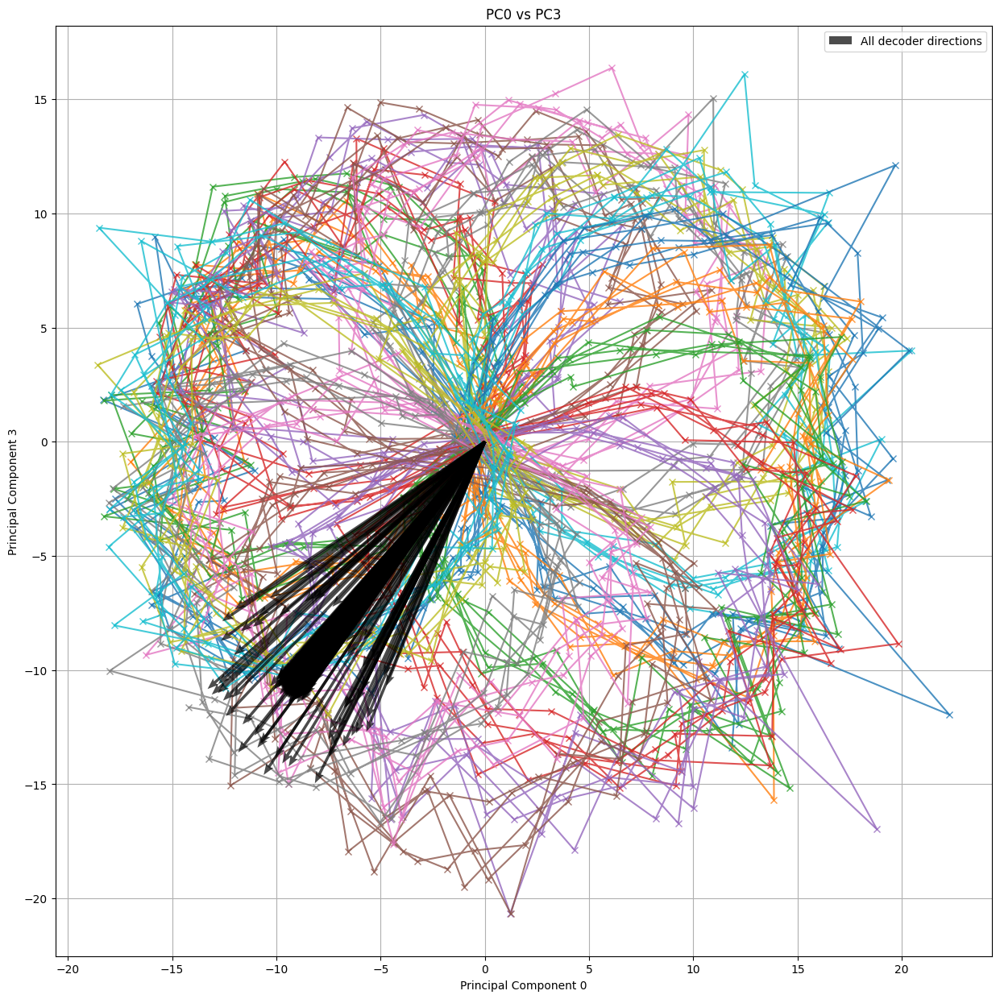

In [12]:
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

bias_d = sae.b_d[3]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
#mlp truth
reconstructions = features @ decoder
recon_a = reconstructions.detach().cpu().numpy()
pca_sae = PCA(n_components=6).fit(recon_a)
output_pca_sae = pca_sae.transform(recon_a)

for a in range(20):
    plt.plot(output_pca_sae[:, 0][a*113:a*113+113], output_pca_sae[:, 3][a*113:a*113+113], marker='x', alpha=0.8)

cluster_i = 14
decoder_cluster = decoder.detach().cpu().numpy() + bias_d.detach().cpu().numpy()
#decoder_cluster = decoder.detach().cpu().numpy()
print(decoder_cluster.shape)
projected_cluster = pca_sae.transform(decoder_cluster)
print(projected_cluster.shape)

# Normalize to unit vectors (preserve direction, make length=1)
directions = projected_cluster[:, [0, 3]]  # Get PC0 and PC3 components
unit_vectors = directions / np.linalg.norm(directions, axis=1, keepdims=True)

extension_factor = 0.2  # Try a much larger number
extended_vectors = projected_cluster * extension_factor

origins_x = np.zeros(len(projected_cluster))
origins_y = np.zeros(len(projected_cluster))

plt.quiver(origins_x, origins_y, 
           extended_vectors[:, 0], extended_vectors[:, 3], 
           scale=1,  # Try scale=1 instead of scale=None
           color='black', alpha=0.7, width=0.003,
           headwidth=3, headlength=4, headaxislength=3.5,
           label=f'All decoder directions',
           zorder=21)

plt.title("PC0 vs PC3")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 3")
plt.grid()
plt.legend()
plt.show()

In [13]:
# cosine sim of principal component directions for pca and pca_sae
from sklearn.metrics.pairwise import cosine_similarity

print(pca.components_.shape, pca_sae.components_.shape)
cosine_sim = cosine_similarity(pca.components_, pca_sae.components_)
print("Cosine Similarity between PCA and PCA_SAE components:")
print(cosine_sim)

(6, 512) (6, 512)
Cosine Similarity between PCA and PCA_SAE components:
[[ 9.9972636e-01 -6.9415895e-04 -2.9746816e-04  7.0356429e-03
  -1.2878969e-02  1.9282312e-04]
 [ 8.0566714e-04  9.9900144e-01 -3.5337478e-02 -1.8271653e-02
   1.1371039e-03 -1.4348915e-03]
 [-3.3076620e-04  3.6587238e-02  9.9622929e-01  7.7275239e-02
  -8.0320090e-03 -2.6847050e-04]
 [-7.2722211e-03  1.5654422e-02 -7.7758282e-02  9.9590850e-01
  -9.4714090e-03 -9.8505281e-03]
 [ 1.3089700e-02 -1.0709091e-03  6.7495853e-03  1.2152645e-02
   9.9767554e-01  1.4590852e-02]
 [-4.4873974e-04  1.5016305e-03 -6.9212168e-04  9.8344516e-03
  -1.5069867e-02  9.9967229e-01]]


(array([5., 3., 1., 2., 1., 3., 0., 0., 0., 1.]),
 array([ 0.0731113 ,  1.2669692 ,  2.46082711,  3.65468502,  4.84854269,
         6.04240084,  7.23625851,  8.43011665,  9.6239748 , 10.81783199,
        12.01169014]),
 <BarContainer object of 10 artists>)

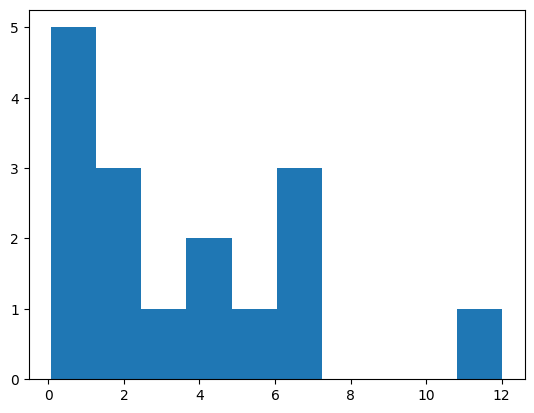

In [14]:
feats_p = []
for thing in features[8*113+11].detach().cpu().numpy():
    if thing > 0:
        feats_p.append(thing)

plt.hist(feats_p)


In [15]:
mlp_a_fixed = batched_acts[3].detach().cpu().numpy()
input_indices = range(inputs.shape[0])[:113]

bias_d = sae.b_d[3]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

feat_i = 8*113+11

plt.figure(figsize=(15, 15))
#mlp truth
print(features[feat_i].shape) #shape 2048
print(decoder.shape) #shape 2048x512
reconstructions = features @ decoder
print(reconstructions.shape) #12769x512
print(str(features[feat_i].unsqueeze(1).shape) + "feat shape") #shape 2048x1
features_interest = features[feat_i].unsqueeze(1)
single_recon_vectors = features_interest * decoder
feat_mask = features_interest > 1e-3
masked_decoder = feat_mask * decoder
single_recon = features[feat_i] @ decoder
print(single_recon.shape) # 512
print(single_recon_vectors.shape) # 2048 x 512
recon_a = reconstructions.detach().cpu().numpy() + bias_d.detach().cpu().numpy()
pca_sae = PCA(n_components=6).fit(recon_a)
output_pca_sae = pca_sae.transform(recon_a)

single_w_bias = single_recon.detach().cpu().numpy() + bias_d.detach().cpu().numpy()
single_w_bias = single_w_bias.reshape(1,-1)
#rand_vec = np.random.uniform(-2,2,size=512)
#rand_vec = np.clip(rand_vec, 0, None)
#single_w_mod = single_w_bias * rand_vec
print(str(single_w_bias.shape) + 'hello')

for a in range(20):
    plt.plot(output_pca_sae[:, 0][a*113:a*113+113], output_pca_sae[:, 3][a*113:a*113+113], marker='x', alpha=0.8)

cluster_i = 14
decoder_cluster = decoder.detach().cpu().numpy() + bias_d.detach().cpu().numpy()
masked_decoder_bias = masked_decoder.detach().cpu().numpy() + bias_d.detach().cpu().numpy()
#decoder_cluster = decoder.detach().cpu().numpy()
projected_cluster = pca_sae.transform(single_recon_vectors.detach().cpu().numpy() + bias_d.detach().cpu().numpy())
projected_decoder = pca_sae.transform(masked_decoder_bias)
projected_act = pca_sae.transform(single_w_bias)

extended_vectors = projected_cluster * 0.1

origins_x = np.zeros(len(projected_cluster))
origins_y = np.zeros(len(projected_cluster))

plt.quiver(origins_x, origins_y, 
           extended_vectors[:, 0], extended_vectors[:, 3], 
           scale=1,  # Try scale=1 instead of scale=None
           color='black', alpha=0.7, width=0.003,
           headwidth=3, headlength=4, headaxislength=3.5,
           label=f'Activated Features (element product - scaled)',
           zorder=22)

extended_vectors = projected_decoder * 0.3

origins_x = np.zeros(len(projected_decoder))
origins_y = np.zeros(len(projected_decoder))

plt.quiver(origins_x, origins_y, 
           extended_vectors[:, 0], extended_vectors[:, 3], 
           scale=1,  # Try scale=1 instead of scale=None
           color='red', alpha=0.7, width=0.003,
           headwidth=3, headlength=4, headaxislength=3.5,
           label=f'Relevant decoder directions (scaled)',
           zorder=21)


plt.quiver(0, 0, 
           projected_act[:, 0], projected_act[:, 3], 
           angles='xy', scale_units='xy', scale=1,projected_masked_decoders
projected_masked_decoders
projected_masked_decoders
projected_masked_decoders
projected_masked_decoders
           label=f'True Activation', color='blue',alpha=0.7, width=0.006,
           headwidth=3, headlength=4, headaxislength=3.5,
           zorder=23)

plt.title("PC0 vs PC3")
plt.xlabel("Principal Component 0")
plt.ylabel("Principal Component 3")
plt.grid()
plt.legend()
plt.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (489933571.py, line 76)

In [ ]:
print(features_interest.shape)

torch.Size([2048, 1])
